# Group Level Network Analysis

In [1]:
from config import *
ds = '36p' # Denoising Strategy:
ct = 'pearson' #Correlation Type
negative_corr = True
tm = 'gce' # Thresholding Method:
           # It could be 'GCE' or 'user_defined'
tv = 0.05  # Thresholding Value, For user defined tm

enodes_name = 'all'

### Import

In [2]:
from src.data import subjects
import src.group_level_analysis.group_level_analysis as gla
from src.viz import viz
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob,os
from IPython.display import display
import seaborn as sns
import random
import hoggorm as ho
import networkx as nx
from skbio.stats.distance import mantel

### Read Data

In [3]:
#all_sub_list = subjects.to_group_level_analysis[0]
all_sub_list = list(subjects.subjects['all']['participant_id'].values)
all_subjects = subjects.subjects['all'][subjects.subjects['all']['participant_id'].isin(all_sub_list)]

subjects_list = {}
for g in subjects_groups:
    subjects_list[g] = all_subjects.where(all_subjects.group==g).dropna()
    print('\n%d %s subjects are included'%(len(subjects_list[g]),g))
    display(subjects_list[g])
    subjects_list[g] = subjects_list[g].participant_id.tolist()


24 CN subjects are included


,group,participant_id,sex,age
0,CN,003S4288,F,78.4
1,CN,011S0021,F,84.9
2,CN,020S6185,M,82.7
3,CN,023S1190,F,87.4
4,CN,035S6160,M,60.7
5,CN,036S6189,F,69.6
6,CN,037S4028,F,70.7
7,CN,041S4200,F,76.4
8,CN,041S6159,M,76.3
9,CN,041S6192,F,83.3



24 EMCI subjects are included


,group,participant_id,sex,age
24,EMCI,012S4987,M,69.0
25,EMCI,002S4473,M,79.9
26,EMCI,011S4547,M,82.8
27,EMCI,011S4893,F,73.4
28,EMCI,012S4188,M,83.2
29,EMCI,014S2308,M,81.4
30,EMCI,037S4706,M,66.2
31,EMCI,041S4513,M,66.4
32,EMCI,041S4974,M,78.4
33,EMCI,068S2184,F,87.4



24 LMCI subjects are included


,group,participant_id,sex,age
48,LMCI,002S4171,M,69.0
49,LMCI,002S4219,F,80.0
50,LMCI,002S4229,M,66.0
51,LMCI,002S4251,M,72.0
52,LMCI,002S4654,F,75.0
53,LMCI,002S4746,F,72.0
54,LMCI,003S4354,M,81.0
55,LMCI,006S4346,M,71.0
56,LMCI,006S4363,F,74.0
57,LMCI,006S4515,M,75.0



24 AD subjects are included


,group,participant_id,sex,age
72,AD,002S5018,M,73.4
73,AD,006S4153,M,81.5
74,AD,006S4867,M,75.7
75,AD,013S5071,M,76.4
76,AD,018S4696,F,73.3
77,AD,018S4733,M,75.4
78,AD,018S5074,F,74.9
79,AD,019S4252,F,86.8
80,AD,019S4477,F,82.4
81,AD,019S4549,M,79.4


In [4]:
featuresDIR = rootdir + '/data/07_features/tm-%s/corr-%s/ds-%s'%(tm,ct,ds)
if enodes_name!='all':
    if negative_corr:
        Ntopdir = glob.glob(featuresDIR + '/*nodes-%s*negative*'%enodes_name)
        Ltopdir = glob.glob(featuresDIR + '/*links-%s*negative*'%enodes_name)

    else:
        Ntopdir = glob.glob(featuresDIR + '/*nodes-%s*positive*'%enodes_name)
        Ltopdir = glob.glob(featuresDIR + '/*links-%s*positive*'%enodes_name)
    if ct == 'glasso':
        Ntopdir = glob.glob(featuresDIR + '/*nodes-%s*'%enodes_name)
        Ltopdir = glob.glob(featuresDIR + '/*links-%s*'%enodes_name)

    lf = [int(i.split(enodes_name + '-')[1].split('_ds')[0]) for i in Ntopdir]
    print("""There are %d sets of features selected based of the %s algorithm. 
    The lengths of these sets are %s. select one of these sets:
    """%(len(lf),enodes_name,lf))
else:
    enodes = list(range(360))
    lf = [0]
    Ntopdir = []
    Ltopdir = glob.glob(featuresDIR + '/*links-%s*negative*'%"fisher")
    if ct == 'glasso':
        Ltopdir = glob.glob(featuresDIR + '/*links-%s*'%"fisher")

In [5]:
selected_set = min(lf)

In [6]:
for i in Ntopdir:
    if int(i.split(enodes_name + '-')[1].split('_ds')[0])== selected_set:
        a = np.load(i)
        enodes = [e[0] for e in a]
        enodes = list(set(enodes))
        enodes.sort()
        break
snd= np.load(Ltopdir[0])

In [7]:
sg = subjects_groups.copy()
sg.append('all')
sg

['CN', 'EMCI', 'LMCI', 'AD', 'all']

In [8]:
str_loc    = ['loc_'  + ds for ds in denoising_strategies]
str_glob   = ['glob_' + ds for ds in denoising_strategies]
strlist    = str_loc.copy()
strlist.extend(str_glob)

In [9]:
if tm=='userdefined':
    tm = '%s-%.3f'%(tm,tv)
sgn = 'positive'
if negative_corr:
    sgn = 'negative'

In [10]:
norm = ""
if normalize_measures:
    norm="_norm"

directoies = {}
for ds in denoising_strategies:
    dirc = '%s/data/06_network_measures/positive/tm-%s/corr-%s/ds-%s'%(rootdir,tm,ct,ds)
    if negative_corr:
        dirc = '%s/data/06_network_measures/negative/tm-%s/corr-%s/ds-%s'%(rootdir,tm,ct,ds)
    if ct=='glasso':
        if sign == 'both':
            dirc = '%s/data/06_network_measures/all/tm-/corr-%s/ds-%s'%(rootdir,ct,ds)
    lc  = 'loc_'  + ds
    glb = 'glob_' + ds
    directoies[glb] = glob.glob("%s/*/*global_measures_giant_component.csv"%(dirc))
    directoies[lc]  = glob.glob("%s/*/*local_measures_giant_component%s.csv"%(dirc,norm))

In [11]:
measures = {}
measures['all'] = {}

for g in subjects_groups: 
    measures[g]  = {}

for i in strlist:
    measures['all'][str(i)] = {}
    for g in subjects_groups: 
        measures[g][str(i)]  = {}
    for sub in directoies[str(i)]:
        id = str(sub.split("/sub-")[1].split('/sub-')[0]) 
        measures['all'][str(i)][id] = pd.read_csv(sub, sep='\t')
        measures['all'][str(i)][id] = measures['all'][str(i)][id].drop(['Unnamed: 0'], axis=1)
        if 'loc' in str(i):
            measures['all'][str(i)][id] = measures['all'][str(i)][id].set_index('ID')
            if enodes_name!='all':
                measures['all'][str(i)][id] = measures['all'][str(i)][id].loc[enodes]
        for g in subjects_groups: 
            if id in subjects_list[g]:
                measures[g][str(i)][id] = pd.read_csv(sub, sep='\t')
                measures[g][str(i)][id] = measures[g][str(i)][id].drop(['Unnamed: 0'], axis=1)
                if 'loc' in str(i):
                    measures[g][str(i)][id] = measures[g][str(i)][id].set_index('ID')
                    if enodes_name!='all':
                        measures[g][str(i)][id] = measures[g][str(i)][id].loc[enodes]

In [12]:
directoies = {}
for ds in denoising_strategies:
    dirc = '%s/data/06_network_measures/positive/tm-%s/corr-%s/ds-%s/'%(rootdir,tm,ct,ds)
    if negative_corr:
        dirc = '%s/data/06_network_measures/negative/tm-%s/corr-%s/ds-%s/'%(rootdir,tm,ct,ds)

    lc  = 'loc_'  + ds
    glb = 'glob_' + ds
    directoies[glb] = glob.glob("%s/*/*global_measures_giant_component.csv"%(dirc))
    directoies[lc]  = glob.glob("%s/*/*local_measures_giant_component.csv"%(dirc))

In [13]:
RAWmeasures = {}
RAWmeasures['all'] = {}

for g in subjects_groups: 
    RAWmeasures[g]  = {}

for i in strlist:
    RAWmeasures['all'][str(i)] = {}
    for g in subjects_groups: 
        RAWmeasures[g][str(i)]  = {}
    for sub in directoies[str(i)]:
        id = str(sub.split("/sub-")[1].split('/sub-')[0]) 
        RAWmeasures['all'][str(i)][id]    = pd.read_csv(sub, sep='\t')
        RAWmeasures['all'][str(i)][id]    = RAWmeasures['all'][str(i)][id].drop(['Unnamed: 0'], axis=1)
        if 'loc' in str(i):
            RAWmeasures['all'][str(i)][id] = RAWmeasures['all'][str(i)][id].set_index('ID')
            if enodes_name!='all':
                RAWmeasures['all'][str(i)][id] = RAWmeasures['all'][str(i)][id].loc[enodes]
        for g in subjects_groups: 
            if id in subjects_list[g]:
                RAWmeasures[g][str(i)][id] = pd.read_csv(sub, sep='\t')
                RAWmeasures[g][str(i)][id] = RAWmeasures[g][str(i)][id].drop(['Unnamed: 0'], axis=1)
                if 'loc' in str(i):
                    RAWmeasures[g][str(i)][id] = RAWmeasures[g][str(i)][id].set_index('ID')
                    if enodes_name!='all':
                        RAWmeasures[g][str(i)][id] = RAWmeasures[g][str(i)][id].loc[enodes]

In [14]:
# measures variable structure:
#
#    measures
#    ├── group 1
#    │   ├── denoising strategy #1- global measures
#    │   │   └── group 1 subjects
#    │   ├── denoising strategy #1- local measures
#    │   │   └── group 1 subjects
#    │   ├── denoising strategy #2- global measures
#    │   │   └── group 1 subjects
#    │   ├── denoising strategy #2- local measures
#    │   │   └── group 1 subjects
#    │   ├── ...
#    │   └── denoising strategy #n- local measures
#    │       └── group 1 subjects
#    ├── ...
#    └── last group
#        ├── denoising strategy #1- global measures
#        │   └── last group subjects
#        ├── denoising strategy #1- local measures
#        │   └── last group subjects
#        ├── denoising strategy #2- global measures
#        │   └── last group subjects
#        ├── denoising strategy #2- local measures
#        │   └── last group subjects
#        ├── ...
#        └── denoising strategy #n- local measures
#            └── last group subject

In [15]:
print('Number of nodes appeared in the giant components of all subjects:\n') 
intersect = {}
for i in str_loc:
    intersect[i] = list(range(360))
    ll=360
    if enodes_name!='all':
        intersect[i] = enodes
        ll = len(enodes)
    for sub in measures['all'][i]:
        a = list(measures['all'][i][sub].index)
        intersect[i] = list(set(intersect[i]) & set(a))
    name = i.split('loc_')[1]
    print('\t%d out of %d nodes for networks with %s thresholding method.'
          %(len(intersect[i]),ll,name))

    #removing nodes
    for sub in measures['all'][i]:
        measures['all'][str(i)][sub] = measures['all'][str(i)][sub].loc[measures['all'][str(i)][sub].index.isin(intersect[i])]

Number of nodes appeared in the giant components of all subjects:

	356 out of 360 nodes for networks with 36p thresholding method.


### local measures mean and variance

In [16]:
# the mvfunc output structure:
#   
#         mvfunc(measures, sub_list, str_list)
#         │  
#         ├── mean
#         │   ├── denoising strategie 2- global measures
#         │   │   └─── subjects
#         │   ├── denoising strategie 1- local measures
#         │   │   └─── subjects
#         │   ├── denoising strategie 2- global measures
#         │   │   └─── subjects
#         │   ├── denoising strategie 2- local measures
#         │   │   └─── subjects
#         │   ├── ...
#         │   │
#         │   ├── denoising strategie n- global measures
#         │   │   └─── subjects
#         │   └── denoising strategie n- local measures
#         │       └─── subjects
#         └── var
#             ├── denoising strategie 2- global measures
#             │   └─── subjects
#             ├── denoising strategie 1- local measures
#             │   └─── subjects
#             ├── denoising strategie 2- global measures
#             │   └─── subjects
#             ├── denoising strategie 2- local measures
#             │   └─── subjects
#             ├── ...
#             │
#             ├── denoising strategie n- global measures
#             │   └─── subjects
#             └── denoising strategie n- local measures
#                 └─── subjects

In [17]:
gla.mvfunc(measures['CN'],subjects_list['CN'], strlist)['mean']['loc_36p']

,003S4288,011S0021,020S6185,023S1190,035S6160,036S6189,037S4028,041S4200,041S6159,041S6192,...,168S6098,168S6085,168S6131,941S6094,116S4453,033S4176,002S4262,002S4225,031S4032,018S4313
degree,0.562487,0.423669,0.440135,0.550634,0.417270,0.319949,0.355893,0.339216,0.318537,0.341538,...,0.427894,0.369996,0.425052,0.407770,0.357342,0.350975,0.461838,0.377069,0.445851,0.530566
eccentricity,0.130919,0.231198,0.030641,0.100279,0.019499,0.011142,0.013928,0.069638,0.000000,0.000000,...,0.019499,0.005571,0.013928,0.011142,0.005571,0.000000,0.061281,0.013928,0.000000,0.000000
betweenness,0.203771,0.132816,0.142832,0.144119,0.111140,0.117627,0.132033,0.118751,0.103701,0.114851,...,0.206615,0.179047,0.178540,0.160176,0.140885,0.153212,0.179863,0.126233,0.101311,0.180037
com_betweenness,0.518382,0.295779,0.329317,0.491901,0.348689,0.258026,0.282248,0.272847,0.256804,0.293182,...,0.358301,0.318346,0.322050,0.301922,0.259166,0.271037,0.344718,0.313393,0.357325,0.369069
eigenvector,0.612387,0.454483,0.462783,0.595465,0.494945,0.400756,0.425084,0.409818,0.386465,0.431064,...,0.482539,0.443155,0.449249,0.447438,0.390303,0.406718,0.485314,0.455104,0.485857,0.503242
katz,0.402932,0.509224,0.523404,0.495873,0.479263,0.453836,0.342077,0.393864,0.450069,0.439293,...,0.530475,0.471066,0.417192,0.505467,0.534867,0.444030,0.473098,0.480001,0.532612,0.450468
closeness,0.606486,0.722984,0.609944,0.639720,0.649100,0.561505,0.555770,0.605248,0.513754,0.528453,...,0.587994,0.522842,0.585562,0.616335,0.567030,0.591967,0.653350,0.588157,0.623677,0.676390
current_flow_closeness,0.774376,0.718909,0.707957,0.794039,0.716491,0.627537,0.678431,0.689524,0.608559,0.611543,...,0.712556,0.686231,0.706022,0.678649,0.641958,0.610648,0.734288,0.680514,0.687140,0.735867
load,0.202932,0.132606,0.143371,0.146541,0.112221,0.119055,0.133770,0.120886,0.105197,0.115902,...,0.213040,0.175649,0.184168,0.162431,0.144088,0.154263,0.181837,0.128458,0.099353,0.180442
clustering_coef,0.030702,0.223342,0.071942,0.039065,0.202455,0.143967,0.093185,0.203161,0.238958,0.207234,...,0.134624,0.121005,0.147792,0.059494,0.218263,0.240005,0.152334,0.149161,0.155459,0.265605


the mean and the variance of centerality measures of all nodes in all adjacency matrices of subjects from a specific group

In [18]:
gla.mvfunc_total(measures,sg,strlist,ds)

,CN_mean,CN_var,EMCI_mean,EMCI_var,LMCI_mean,LMCI_var,AD_mean,AD_var,all_mean,all_var
degree,0.398451,0.049768,0.383606,0.046397,0.386545,0.050920,0.388346,0.050309,0.389591,0.049347
eccentricity,0.033078,0.031988,0.027394,0.026647,0.128366,0.101570,0.072672,0.067399,0.065177,0.058349
betweenness,0.140861,0.023019,0.158538,0.029104,0.134136,0.022033,0.140081,0.022850,0.143545,0.024362
com_betweenness,0.318801,0.063668,0.293949,0.054117,0.318452,0.064844,0.320125,0.068198,0.313212,0.062832
eigenvector,0.452524,0.056146,0.427261,0.049906,0.446314,0.058923,0.444979,0.061271,0.443194,0.056601
katz,0.475840,0.028705,0.472550,0.028113,0.448452,0.030806,0.485061,0.030120,0.470566,0.029638
closeness,0.592251,0.031074,0.587322,0.029260,0.563123,0.031996,0.557364,0.032076,0.575388,0.031241
current_flow_closeness,0.683716,0.040535,0.667433,0.039726,0.664762,0.045220,0.671591,0.043261,0.672313,0.042102
load,0.142066,0.022840,0.159535,0.028792,0.134746,0.021844,0.141147,0.022784,0.144511,0.024179
clustering_coef,0.166011,0.026878,0.168411,0.022761,0.154040,0.025410,0.149824,0.025600,0.159609,0.025180


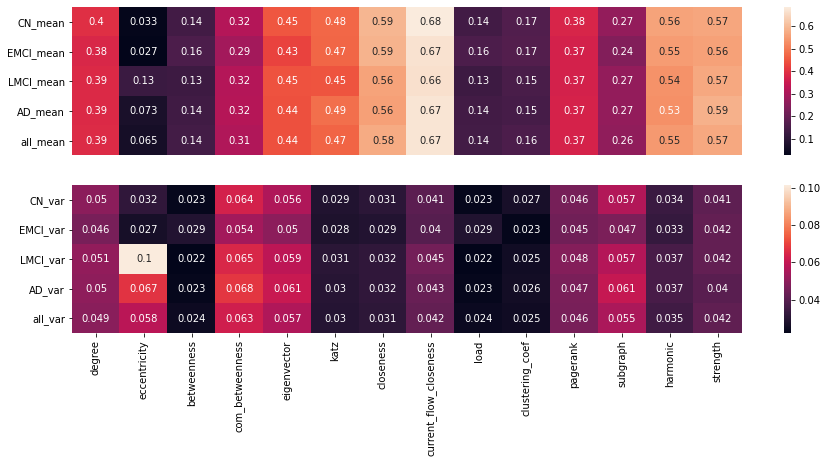

In [19]:
plt.figure(figsize=(15,6))

plt.subplot(211)
sns.heatmap(gla.mvfunc_total(measures,sg,strlist,ds).T.
            iloc[[2*i for i in range(int(len(subjects_groups)/2)*2+1)]],
            annot=True, xticklabels=False)
plt.subplot(212)

sns.heatmap(gla.mvfunc_total(measures,sg,strlist,ds).T.
            iloc[[2*i+1 for i in range(int(len(subjects_groups)/2)*2+1)]],
            annot=True)
plt.show()

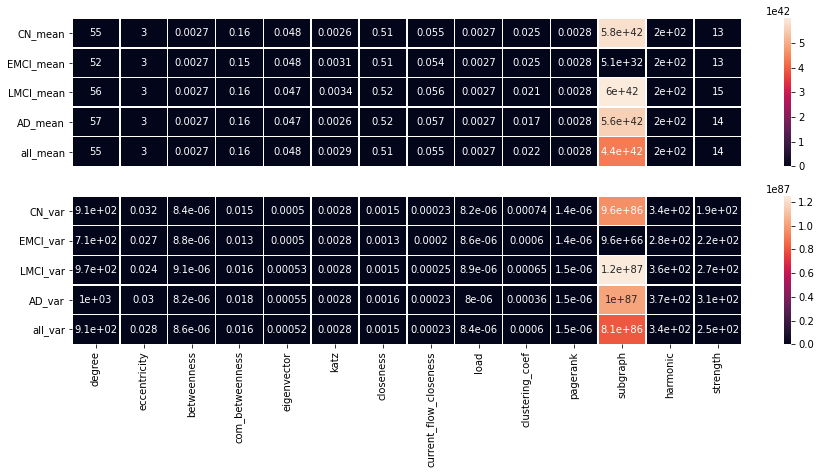

In [20]:
plt.figure(figsize=(15,6))

plt.subplot(211)
sns.heatmap(gla.mvfunc_total(RAWmeasures,sg,strlist,ds).T.
            iloc[[2*i for i in range(int(len(subjects_groups)/2)*2+1)]],
            annot=True, xticklabels=False,linewidths=.5, linecolor='white')
plt.subplot(212)

sns.heatmap(gla.mvfunc_total(RAWmeasures,sg,strlist,ds).T.
            iloc[[2*i+1 for i in range(int(len(subjects_groups)/2)*2+1)]],
            annot=True,linewidths=.5, linecolor='white')
plt.show()

### Histogram of  raw measures

In [21]:
total_RAWmeasures={}
total_RAWmeasures['all'] ={}

for i in all_subjects.index:
    try:
        total_RAWmeasures[all_subjects.iloc[i]['group']]=pd.concat([total_RAWmeasures[all_subjects.iloc[i]['group']],RAWmeasures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]])
        total_RAWmeasures['all']= pd.concat([total_RAWmeasures['all'],RAWmeasures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]])
        
    except:
        total_RAWmeasures[all_subjects.iloc[i]['group']]=RAWmeasures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]
        if pd.DataFrame(total_RAWmeasures['all']).empty:
            total_RAWmeasures['all']=RAWmeasures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]


Histogram of degree


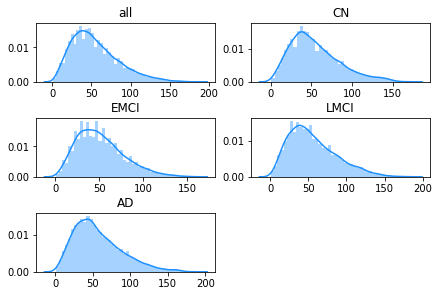


Histogram of eccentricity


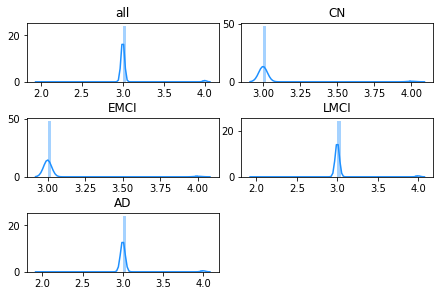


Histogram of betweenness


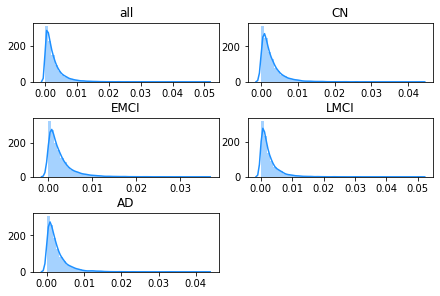


Histogram of com_betweenness


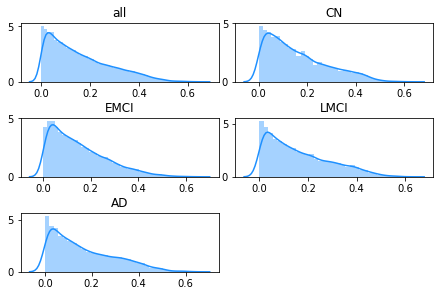


Histogram of eigenvector


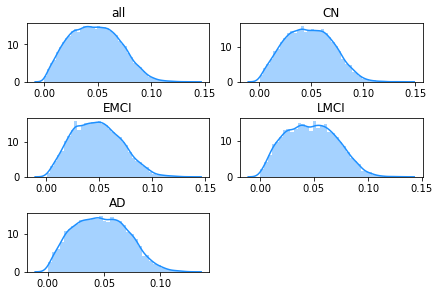


Histogram of katz


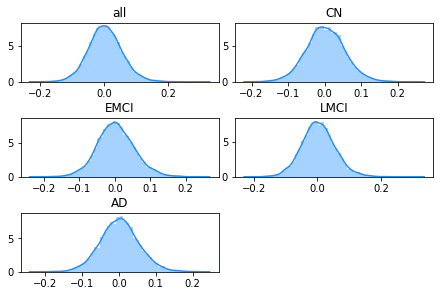


Histogram of closeness


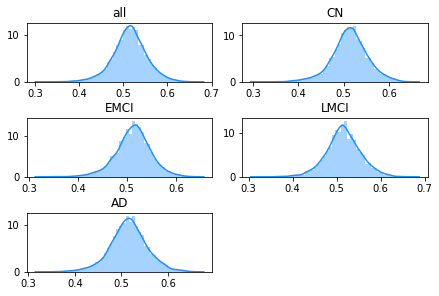


Histogram of current_flow_closeness


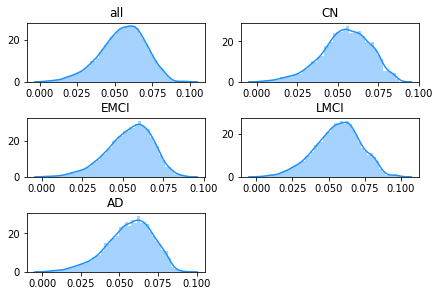


Histogram of load


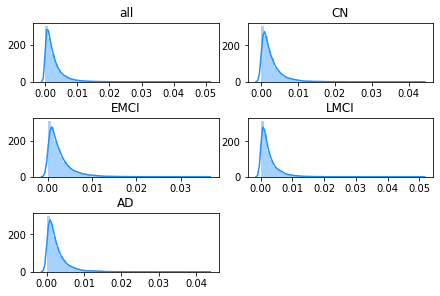


Histogram of clustering_coef


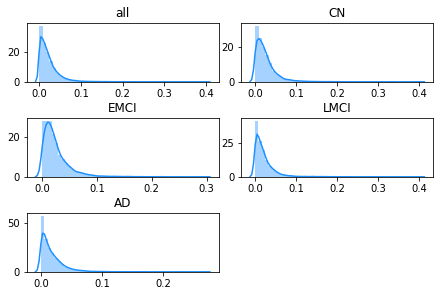


Histogram of pagerank


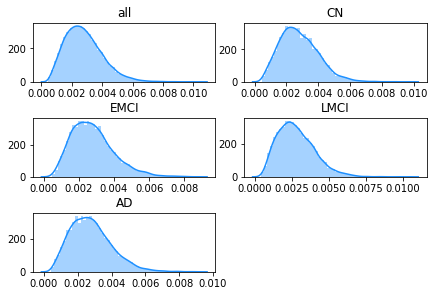


Histogram of subgraph


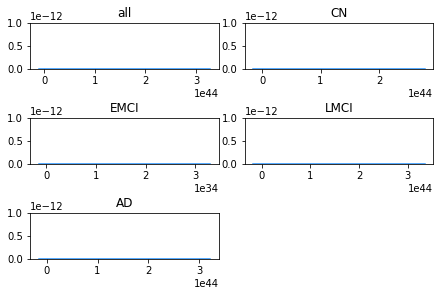


Histogram of harmonic


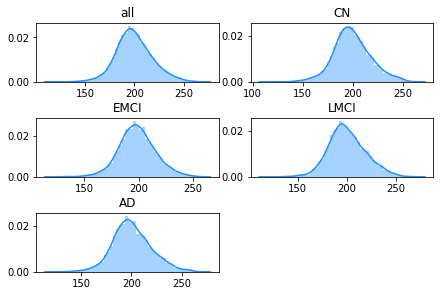


Histogram of strength


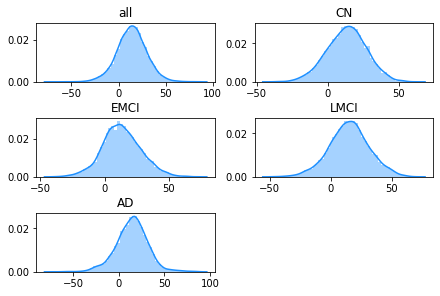

In [22]:
#plt.figure(figsize=(12,15))
mes = total_RAWmeasures['all'].T.index
for j in range(len(mes)):
    print('\nHistogram of %s'%mes[j])
    for i in range(len(total_RAWmeasures.keys())):
        g = list(total_RAWmeasures.keys())[i]
        plt.subplot(int((len(total_RAWmeasures.keys())+1)/2),2,i+1)
        sns.distplot(total_RAWmeasures[g][mes[j]].values, color="dodgerblue", label="Compact")
        plt.title(g)
    plt.tight_layout(pad=.3)
    plt.show()

### Histogram of MinMax normalized measures

In [23]:
total_measures={}
total_measures['all'] ={}

for i in all_subjects.index:
    try:
        total_measures[all_subjects.iloc[i]['group']]=pd.concat([total_measures[all_subjects.iloc[i]['group']],measures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]])
        total_measures['all']= pd.concat([total_measures['all'],measures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]])
        
    except :
        total_measures[all_subjects.iloc[i]['group']]=measures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]
        if pd.DataFrame(total_measures['all']).empty:
            total_measures['all']=measures['all'][str_loc[0]][all_subjects.iloc[i]['participant_id']]


Histogram of degree


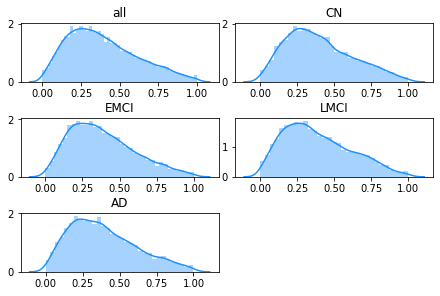


Histogram of eccentricity


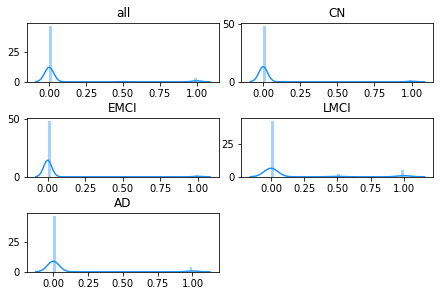


Histogram of betweenness


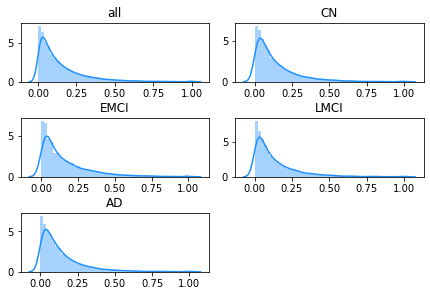


Histogram of com_betweenness


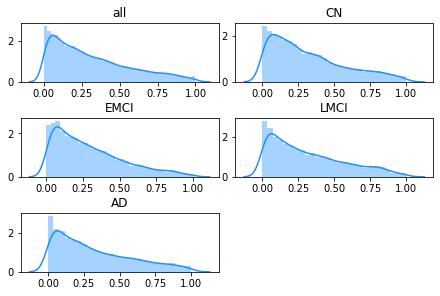


Histogram of eigenvector


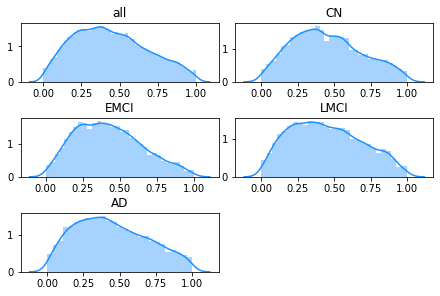


Histogram of katz


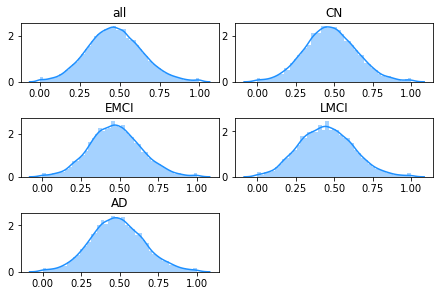


Histogram of closeness


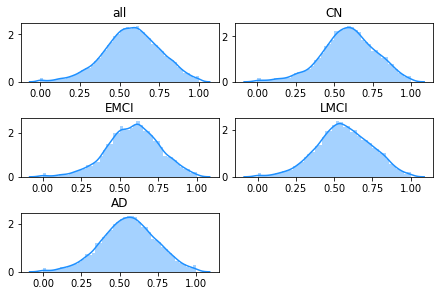


Histogram of current_flow_closeness


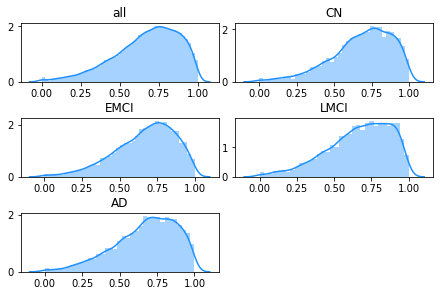


Histogram of load


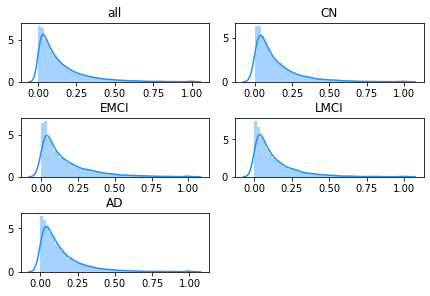


Histogram of clustering_coef


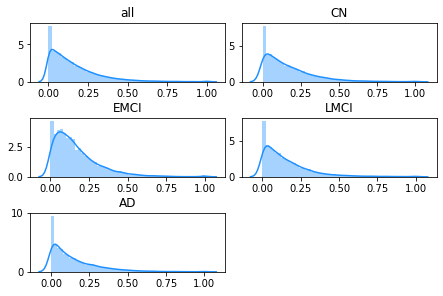


Histogram of pagerank


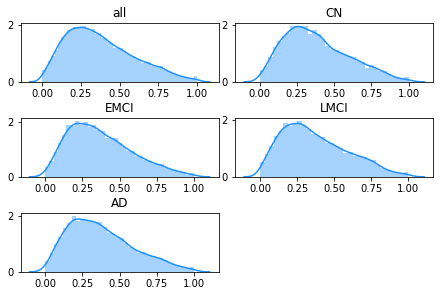


Histogram of subgraph


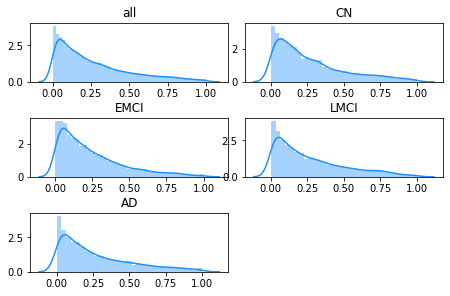


Histogram of harmonic


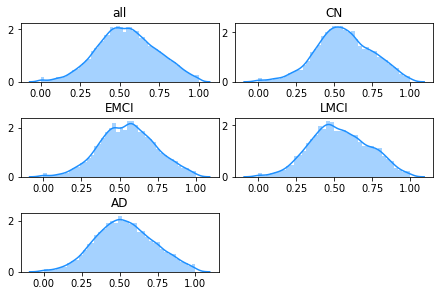


Histogram of strength


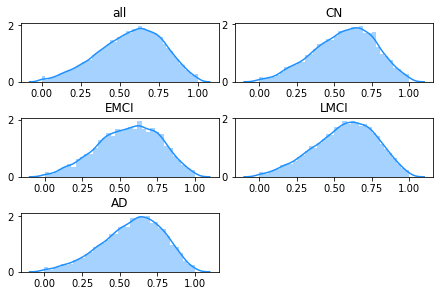

In [24]:
#plt.figure(figsize=(12,15))
mes = total_measures['all'].T.index
for j in range(len(mes)):
    print('\nHistogram of %s'%mes[j])
    for i in range(len(total_measures.keys())):
        g = list(total_measures.keys())[i]
        plt.subplot(int((len(total_measures.keys())+1)/2),2,i+1)
        sns.distplot(total_measures[g][mes[j]].values, color="dodgerblue", label="Compact")
        plt.title(g)
    plt.tight_layout(pad=.3)
    plt.show()

### Correlation between centraliry measures among members of each group

#### Correlation between centraliry measures among a random selection of members of each group
Splitting each group of subjects in half and rebuilding measures variable:

In [25]:
measures_h1 = dict()
measures_h2 = dict()
for g in subjects_groups:
    measures_h1[g] = dict()
    measures_h2[g] = dict()
    for sr in str_loc:
        main = list(measures[g][sr].keys())
        h1 = random.sample(main, k=int(len(main)/2))
        h2 = [s for s in main if s not in h1 and s ]
        measures_h1[g][sr] = dict()
        measures_h2[g][sr] = dict()

        for (key, value) in measures[g][sr].items():
            if key in h1:
                measures_h1[g][sr][key] = value
        for (key, value) in measures[g][sr].items():
            if key in h2:
                measures_h2[g][sr][key] = value

In [26]:
mes_rel    = gla.mes_rel(measures,sg,strlist,ds)
mes_rel_h1 = gla.mes_rel(measures_h1,subjects_groups,strlist,ds)
mes_rel_h2 = gla.mes_rel(measures_h2,subjects_groups,strlist,ds)

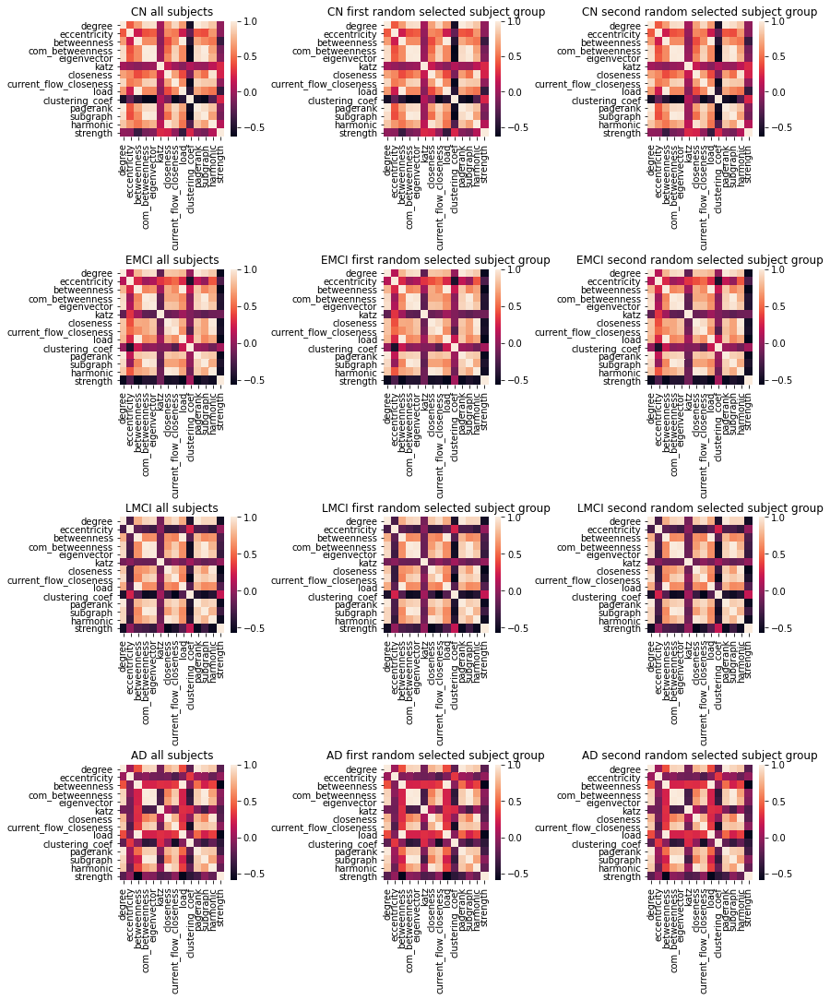

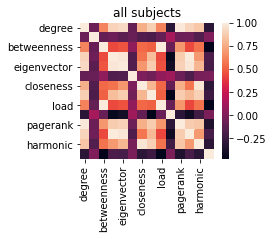

In [27]:
ff = plt.figure(figsize=(12,15))
ax = [ff.add_subplot((len(subjects_groups)),3,k+1) for k in range(3*len(subjects_groups))]
g =[]
for i in range(len(subjects_groups)):
    g.append(sns.heatmap(mes_rel['corr'][str_loc[0]][subjects_groups[i]],ax=ax[3*i]))
    ax[3*i].title.set_text('%s all subjects'%subjects_groups[i])
    
    g.append(sns.heatmap(mes_rel['corr'][str_loc[0]][subjects_groups[i]],ax=ax[3*i+1]))
    ax[3*i+1].title.set_text('%s first random selected subject group'%subjects_groups[i])

    g.append(sns.heatmap(mes_rel['corr'][str_loc[0]][subjects_groups[i]],ax=ax[3*i+2]))
    ax[3*i+2].title.set_text('%s second random selected subject group'%subjects_groups[i])
plt.tight_layout(pad=.5)

ff = plt.figure(figsize=(3,2.5))
ax = ff.add_subplot(1,1,1)
sns.heatmap(mes_rel['corr']['loc_36p']['all'],ax=ax)
ax.title.set_text("all subjects")

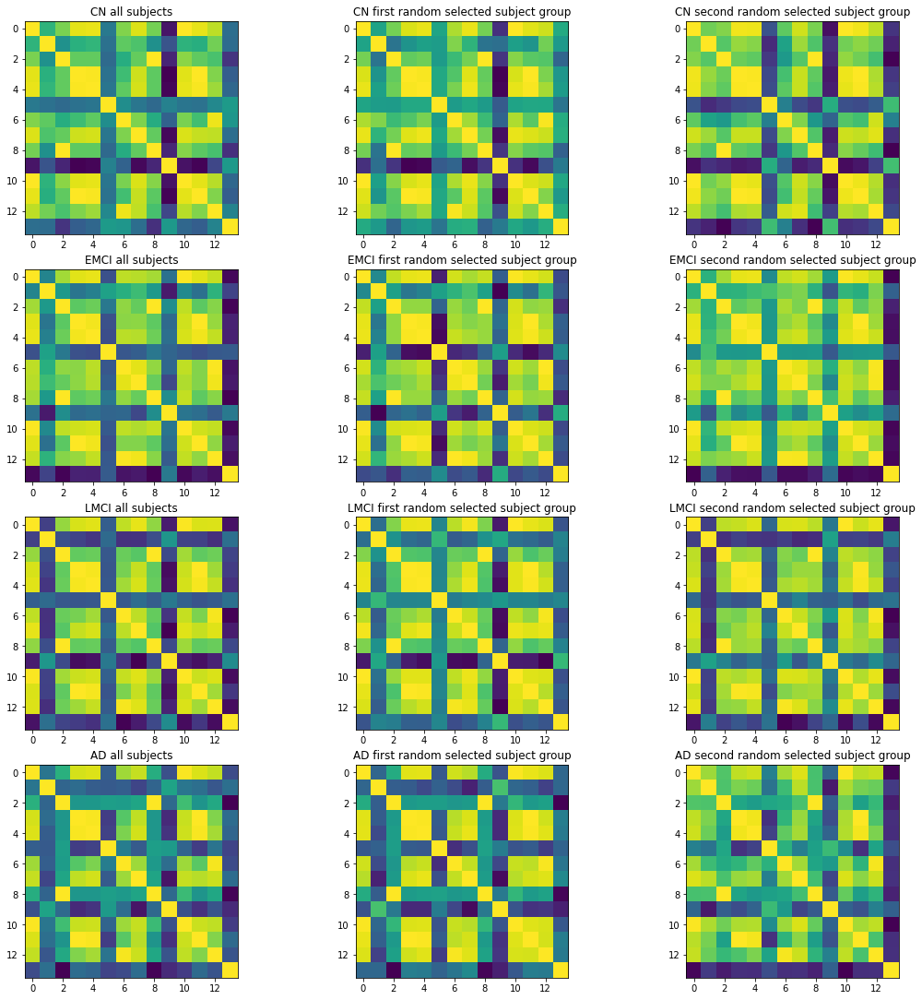

In [28]:
ff = plt.figure(figsize=(15,15))
ax = [ff.add_subplot((len(subjects_groups)),3,k+1) for k in range(3*len(subjects_groups))]
L = []
labels = []
for i in range(len(subjects_groups)):
    a = mes_rel['corr'][str_loc[0]][subjects_groups[i]]
    ax[3*i].imshow(a)
    ax[3*i].title.set_text('%s all subjects'%subjects_groups[i])
    L.append(a - np.mean(a))
    labels.append("all %s"%subjects_groups[i])
    
    a = mes_rel_h1['corr'][str_loc[0]][subjects_groups[i]]
    ax[3*i+1].imshow(a)
    ax[3*i+1].title.set_text('%s first random selected subject group'%subjects_groups[i])
    L.append(a - np.mean(a))
    labels.append("first subgroup of %s"%subjects_groups[i])

    a = mes_rel_h2['corr'][str_loc[0]][subjects_groups[i]]
    ax[3*i+2].imshow(a)
    ax[3*i+2].title.set_text('%s second random selected subject group'%subjects_groups[i])
    L.append(a - np.mean(a))
    labels.append("second subgroup of %s"%subjects_groups[i])

plt.tight_layout(pad=.5)

#### Correlation between these correlation matrices 

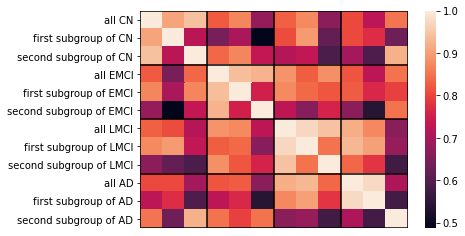

In [29]:
rv_results0 = ho.RVcoeff(L)

fig, ax = plt.subplots()         # Sample figsize in inches
ax = sns.heatmap(rv_results0,yticklabels=labels,xticklabels=False,ax=ax)
ax.hlines([3*i for i in range(len(subjects_groups)+1)], *ax.get_xlim())
ax.vlines([3*i for i in range(len(subjects_groups)+1)], *ax.get_xlim())

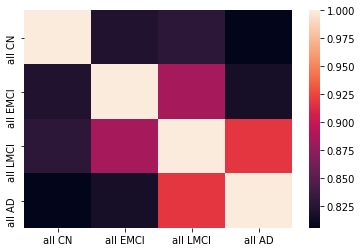

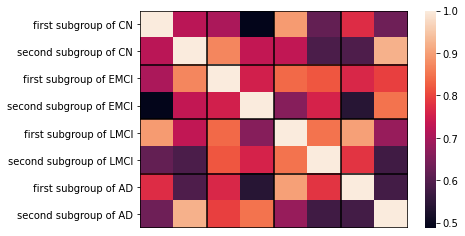

In [30]:
Lall = [L[3*i] for i in range(int(len(L)/3))]
labelsall = [labels[3*i] for i in range(int(len(L)/3))]
rv_results1 = ho.RVcoeff(Lall)
fig, ax = plt.subplots()         # Sample figsize in inches
ax = sns.heatmap(rv_results1,yticklabels=labelsall,xticklabels=labelsall,ax=ax)

Lh = []
for i in range(int(len(L)/3)):
    Lh.append(L[3*i+1])
    Lh.append(L[3*i+2])
labelsh = [i for i in labels if i not in labelsall]

rv_results1 = ho.RVcoeff(Lh)
fig, ax = plt.subplots()         # Sample figsize in inches
ax = sns.heatmap(rv_results1,yticklabels=labelsh,xticklabels=False,ax=ax)
ax.hlines([2*i for i in range(len(subjects_groups)+1)], *ax.get_xlim())
ax.vlines([2*i for i in range(len(subjects_groups)+1)], *ax.get_xlim())

### Correlation between subjects
list of subjects sorted based on their group:

In [31]:
cols = subjects_list[subjects_groups[0]].copy()
sep=[len(subjects_list[subjects_groups[0]])]
for i in range(1,len(subjects_groups)):
    cols.extend(subjects_list[subjects_groups[i]])
    sep.append(len(subjects_list[subjects_groups[i]]) + sep[i-1])
sep.insert(0,0)

#### Correlation based on centrality measures

###### Correlation based on each local centraliry measures for each subject.

In [32]:
mes = list(mes_rel['corr'][strlist[0]][subjects_groups[0]].index)    

In [33]:
mtx = {}
for m in mes:
    mtx[m] = {}
    for sr in str_loc:
        mtx[m][sr] = 0
        for s in cols:
            try:
                mtx[m][sr]=np.concatenate((mtx[m][sr], measures['all'][sr][s][m].values.reshape(len(measures['all'][sr][s][m]),1)),
                                   axis=1)
            except ValueError:
                mtx[m][sr]=measures['all'][sr][s][m].values.reshape(len(measures['all'][sr][s][m]),1)
    mtx[m][sr] = np.corrcoef(mtx[m][sr].T)  

/home/alireza/Thesis/THSenv/lib/python3.6/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/alireza/Thesis/THSenv/lib/python3.6/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


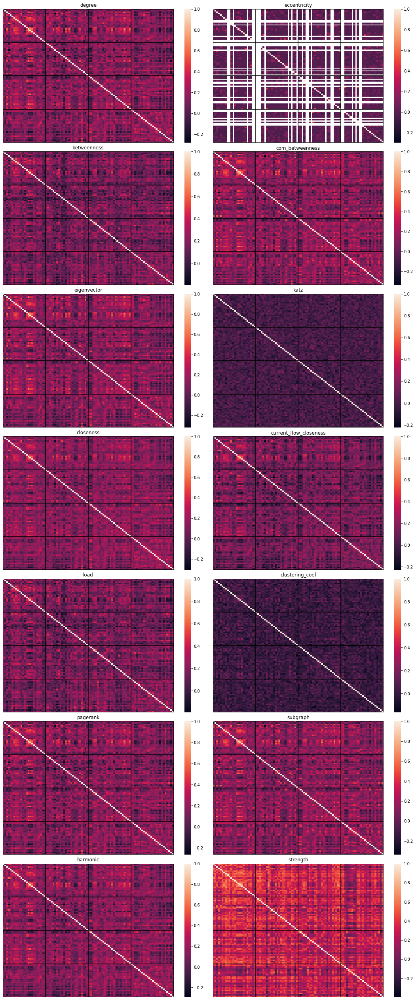

In [34]:
print('sections : ',subjects_groups)
print('size     : ',sep)
ff = plt.figure(figsize=(15,35))
ax = [ff.add_subplot(int((len(mes)+1)/2),2,k+1) for k in range(len(mes))]
dr =[]
for sr in str_loc:
    for i in range(len(mes)):
        ax[i].title.set_text(mes[i])
        dr = sns.heatmap(mtx[mes[i]][sr],xticklabels=False,yticklabels=False,ax=ax[i])
        dr.hlines(sep, *dr.get_xlim())
        dr.vlines(sep, *dr.get_xlim())
plt.tight_layout(pad=.5)
plt.show()

### Standard error and confidence intervals for measures

In [35]:
CR = {}
comb = {}
for sr in str_loc:
    CR[sr] = {}
    comb[sr] ={}
    for i in range(len(sep)-1):
        CR[sr][subjects_groups[i]]={}
        comb[sr][subjects_groups[i]]={}
        for m1 in mes:
            CR[sr][subjects_groups[i]][m1]=[]
            comb[sr][subjects_groups[i]][m1]=[]
            for m2 in mes:
                for s in cols[sep[i]:sep[i+1]]:
                    comb[sr][subjects_groups[i]][m1].append(m2[0:5])
                    CR[sr][subjects_groups[i]][m1].append(np.corrcoef(
                        measures['all'][sr][s][m1].values,
                        measures['all'][sr][s][m2].values)[1,0])
            comb[sr][subjects_groups[i]][m1] = np.array(comb[sr][subjects_groups[i]][m1])
            CR[sr][subjects_groups[i]][m1] = np.array(CR[sr][subjects_groups[i]][m1])
            idx = np.where(1 * np.isnan(CR[sr][subjects_groups[i]][m1])==0)[0]
            comb[sr][subjects_groups[i]][m1] = comb[sr][subjects_groups[i]][m1][idx]
            CR[sr][subjects_groups[i]][m1] = CR[sr][subjects_groups[i]][m1][idx]

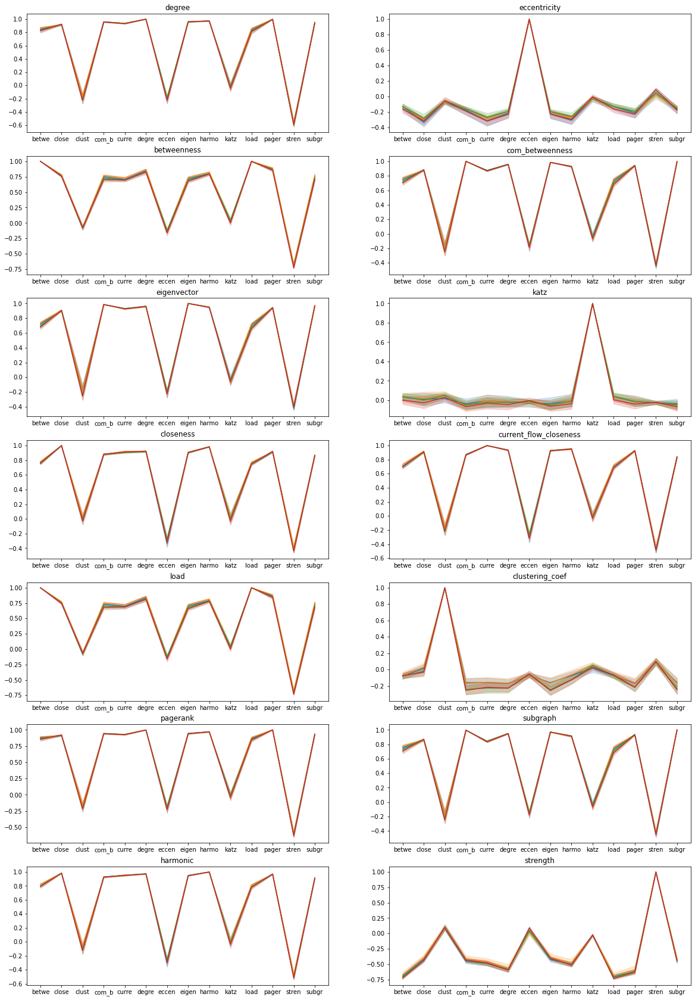

In [36]:
ff = plt.figure(figsize=(20,30))
ax = [ff.add_subplot(int(((len(mes))+1)/2),2,k+1) for k in range(len(mes))]
dr =[]
for i in range(len(mes)):
    for g in subjects_groups:
        dr.append(sns.lineplot(x=comb['loc_36p'][g][mes[i]], y=CR['loc_36p'][g][mes[i]],ax=ax[i]))
    ax[i].title.set_text('%s'%mes[i])

##### Correlation based on the mean of different local centraliry measures for each subject.

In [37]:
sub_rel = gla.sub_rel(measures,sg,strlist,'36p')

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


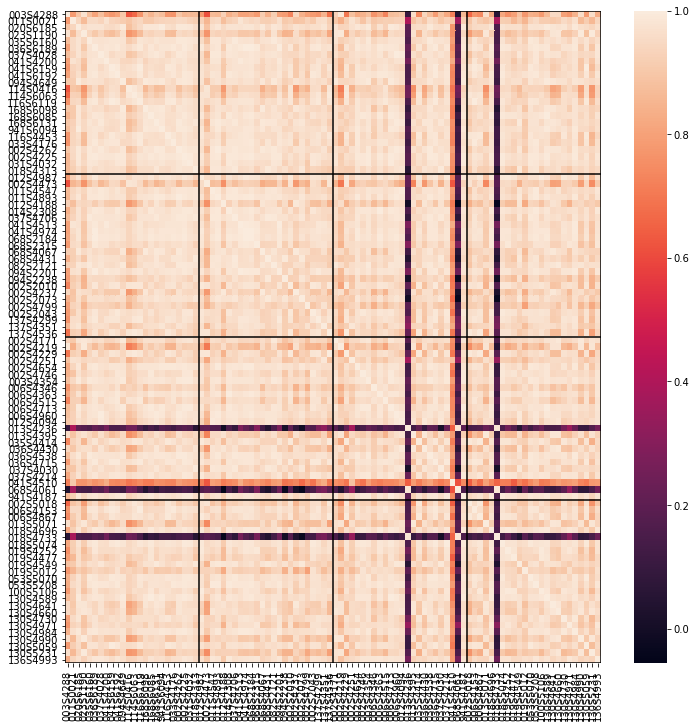

In [38]:
ordered = sub_rel['corr']['loc_36p']['all'][cols]
ordered = ordered.T[cols]
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(ordered,xticklabels=True,yticklabels=True,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

In [39]:
color = []
n = len(subjects_groups)
for i in range(n):
    color.append('#%06X' % random.randint(0, 0xFFFFFF))

In [40]:
lut = {}
for i in range(n):
    if i != 0:
        for j in range(sep[i-1],sep[i]):
            lut[cols[j]] = color[i]
    if i == 0:
        for j in range(sep[i]):
            lut[cols[j]] = color[i]
cl = pd.DataFrame(lut, index=[1])

['#79A306', '#4086BA', '#2CCEB5', '#6EB4CF']
['CN', 'EMCI', 'LMCI', 'AD']


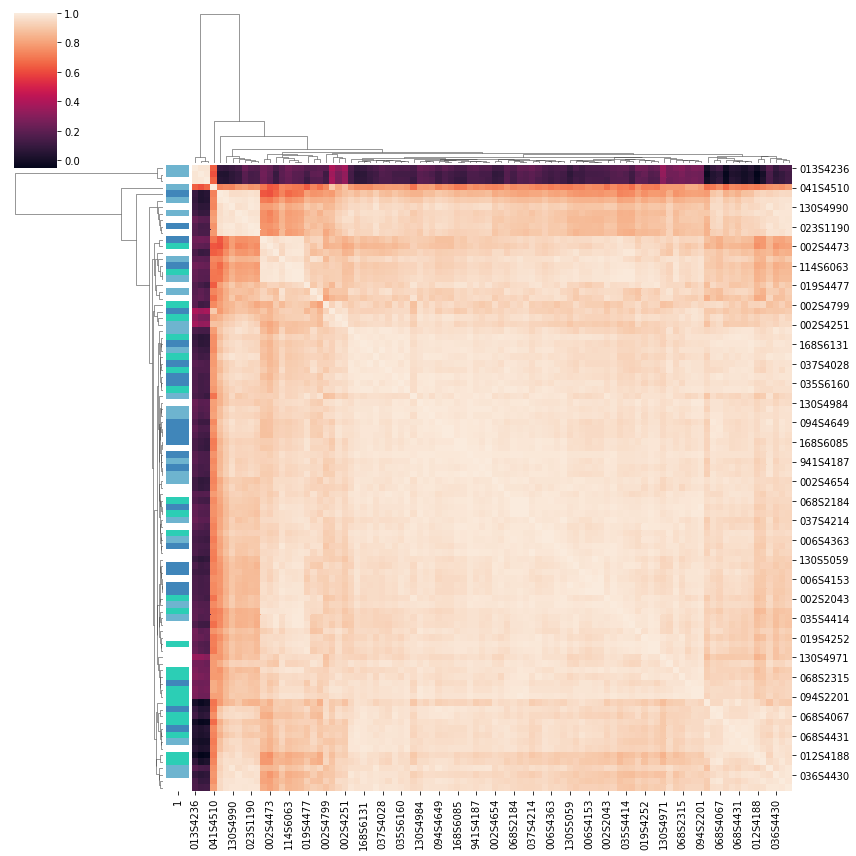

In [41]:
print(color)
print(subjects_groups)
g = sns.clustermap(ordered, row_colors=cl.T,figsize=(12, 12))

#### Correlation based on correlation matrices

In [42]:
subL = []
subLRAW = []
removed = []
if enodes_name!= 'all':
    removed = [i for i in range(360) if i not in enodes]
for s in cols:
    M = gla.read_M(s,ds,ct)
    for i in removed:
        M[i,:]= np.zeros(np.shape(M)[0])
        M = M.T
        M[i,:]= np.zeros(np.shape(M)[0])
        M = M.T
    subLRAW.append(M - np.mean(M))
    M = M[enodes,:][:,enodes]
    subL.append(M - np.mean(M))

In [43]:
rv_results = ho.RVcoeff(subL)

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


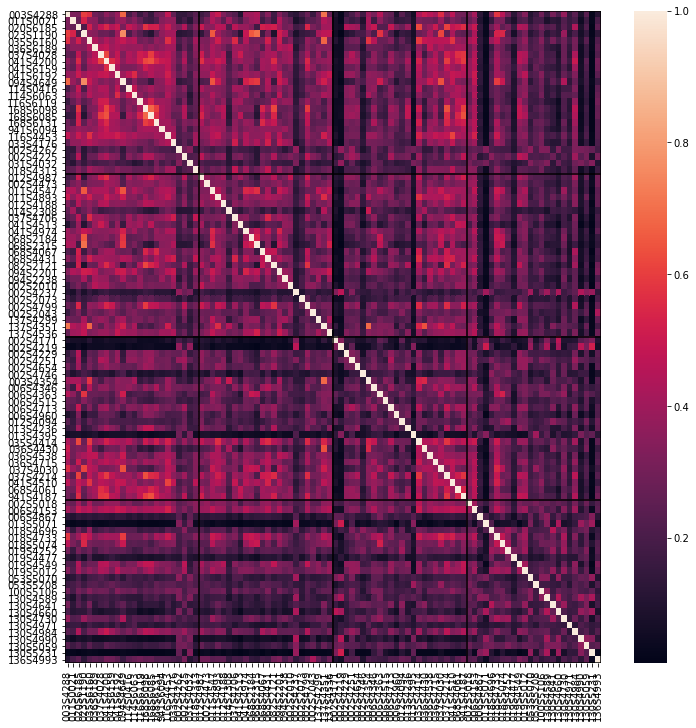

In [44]:
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(rv_results,xticklabels=cols,yticklabels=cols,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

In [45]:
subC = 0
for i in range(sep[-1]):
    try:
        subC = np.concatenate((subC,subL[i].reshape((1,np.shape(subL[3])[0]*np.shape(subL[3])[0]))), axis=0)
    except ValueError:
        subC = subL[i].reshape((1,np.shape(subL[3])[0]*np.shape(subL[3])[0]))

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


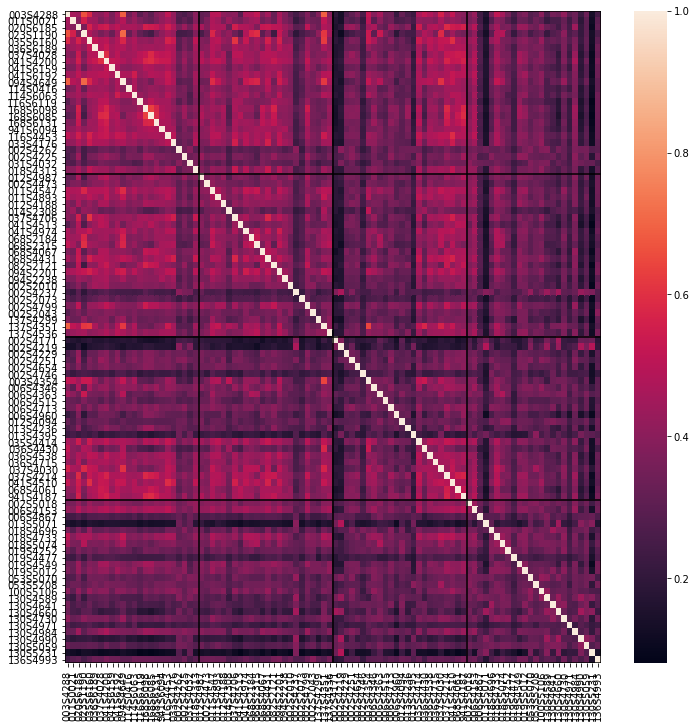

In [46]:
pearsonC = np.corrcoef(subC, y=None, rowvar=True)
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(pearsonC,xticklabels=cols,yticklabels=cols,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

mantelC = np.zeros((sep[-1], sep[-1]), float)
for i in range(sep[-1]):
    for j in range(i+1,sep[-1]):
        a = subL[i]
        b = subL[j]
        np.fill_diagonal(a, 0)
        np.fill_diagonal(b, 0)
        a = np.round(a, 9)
        b = np.round(b, 9)
        mantelC[i,j] = mantel(a,b)[0]

mantelC = np.where(mantelC,mantelC,mantelC.T)

fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(mantelC,xticklabels=False,yticklabels=False,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

### Mean Network

#### Construct the mean network of all subjects from different groups:

In [47]:
os.system("mkdir -p %s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/"%(rootdir,tm,ct,ds))
meanM = {}
meanG = {}
for g in range(len(subjects_groups)):
    con  = np.dstack(subLRAW[sep[g]:sep[g+1]])
    meanM[subjects_groups[g]] = np.mean(con, axis=2)
    meanG[subjects_groups[g]] = nx.from_numpy_matrix(meanM[subjects_groups[g]])
    nx.write_gexf(meanG[subjects_groups[g]],"%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s_ds-%s_corr-%s_tm-%s.gexf"
                  %(rootdir,tm,ct,ds,subjects_groups[g],'corr',ds,ct,tm))                    
    np.save("%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s_ds-%s_corr-%s_tm-%s"
                  %(rootdir,tm,ct,ds,subjects_groups[g],'corr',ds,ct,tm), meanM[subjects_groups[g]] )

con = np.dstack(subLRAW[0:sep[-1]])
meanM['all'] = np.mean(con, axis=2)
meanG['all'] = nx.from_numpy_matrix(meanM['all'])
nx.write_gexf(meanG['all'],"%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s_ds-%s_corr-%s_tm-%s.gexf"
              %(rootdir,tm,ct,ds,'all','corr',ds,ct,tm))                    
np.save("%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s_ds-%s_corr-%s_tm-%s"
        %(rootdir,tm,ct,ds,'all','corr',ds,ct,tm), meanM['all'])

#### Visualize the mean networks:

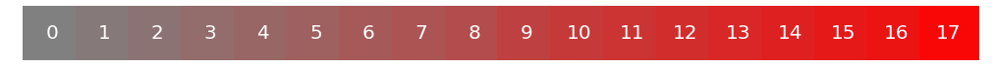

Top 0.5% edges Of Mean Network of correlation matrices Between CN Subjects


/home/alireza/Thesis/THSenv/lib/python3.6/site-packages/matplotlib/collections.py:886: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


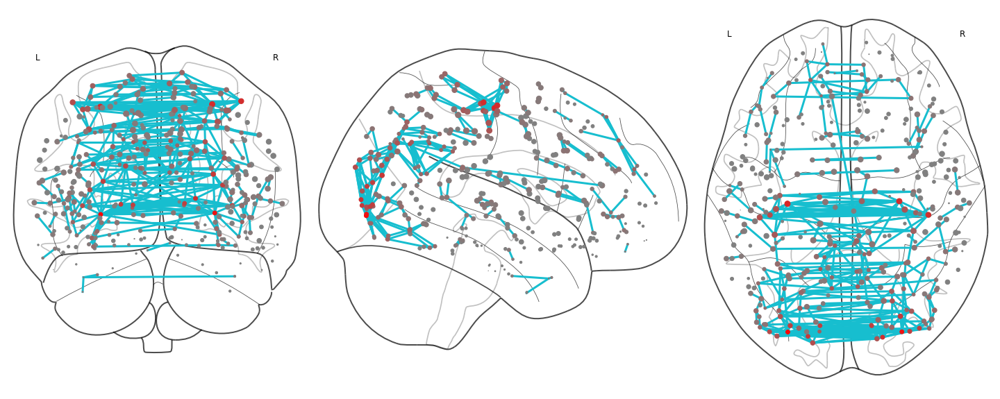

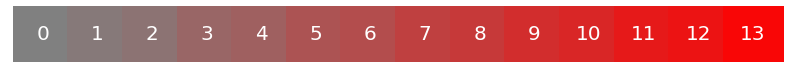

Top 0.5% edges Of Mean Network of correlation matrices Between EMCI Subjects


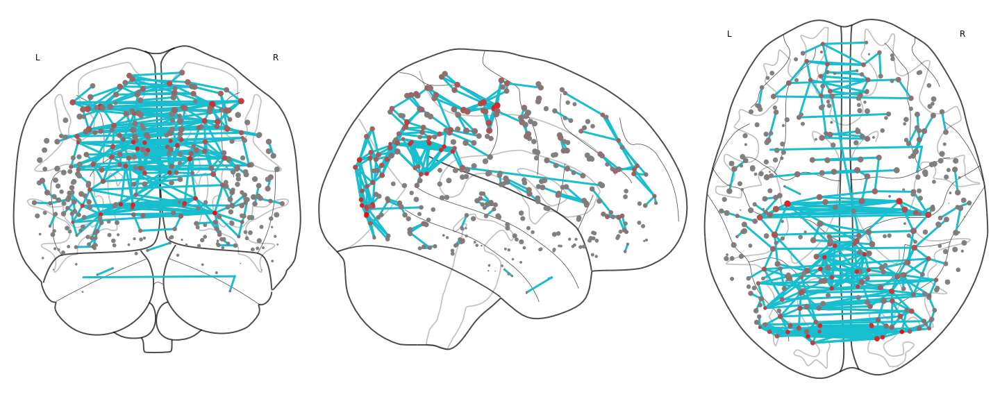

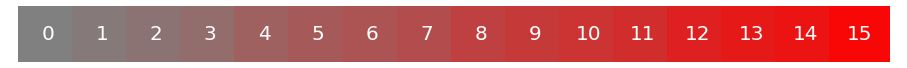

Top 0.5% edges Of Mean Network of correlation matrices Between LMCI Subjects


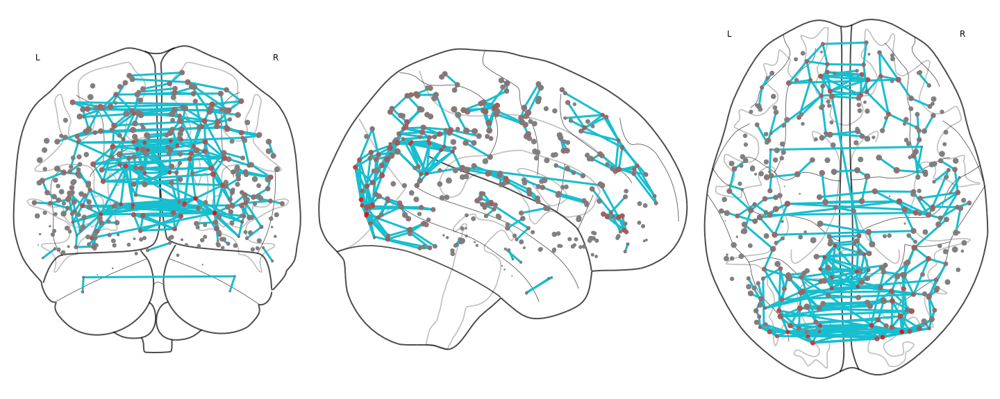

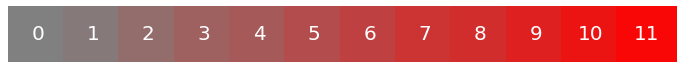

Top 0.5% edges Of Mean Network of correlation matrices Between AD Subjects


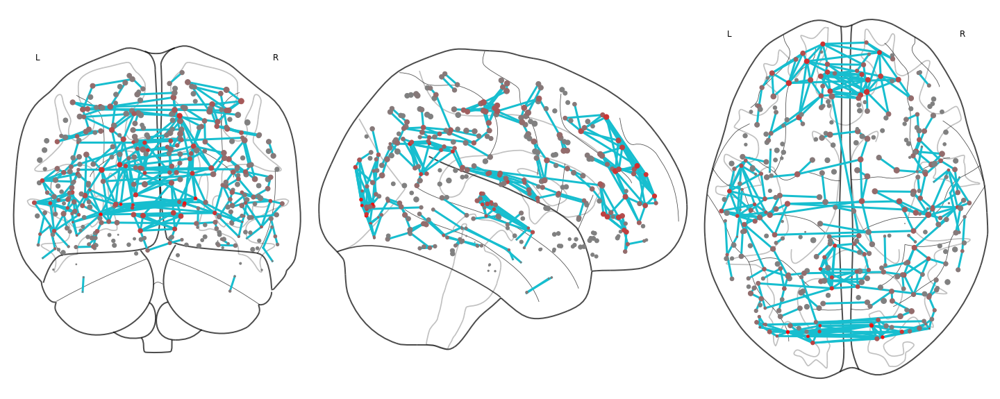

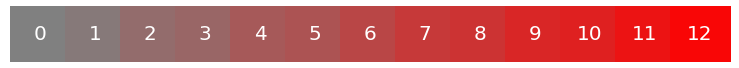

Top 0.5% edges Of Mean Network of correlation matrices Between all Subjects


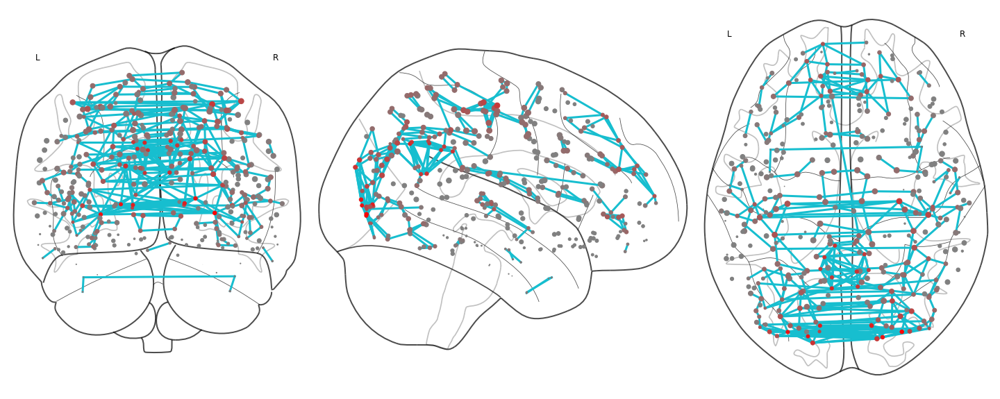

In [48]:
dirc = rootdir + "/figs/mean_network/corr"
for g in sg:
    title = "Top 0.5%% edges Of Mean Network of correlation matrices Between %s Subjects"%g
    viz.brain_viz_from_path(cm = meanM[g],title=title,density=.005,method='2d')

#### Correlation between the mean networks and the subjects

In [49]:
mean_sub = np.zeros((len(cols),len(subjects_groups)))
for j in range(len(subjects_groups)):
    mv = meanM[subjects_groups[j]].reshape((1,np.shape(subLRAW[3])[0]*np.shape(subLRAW[3])[0]))
    for i in range(len(cols)):
        s = subLRAW[i].reshape((1,np.shape(subLRAW[3])[0]*np.shape(subLRAW[3])[0]))
        mean_sub[i,j] = np.corrcoef(mv,s)[0,1]

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


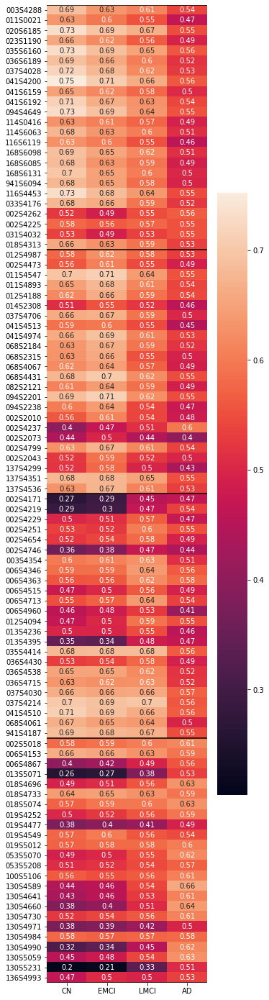

In [50]:
fig, ax = plt.subplots(figsize=(5,25))         # Sample figsize in inches
ax = sns.heatmap(mean_sub,
            xticklabels=subjects_groups,
            yticklabels=cols,
            annot=True, ax = ax)
ax.hlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

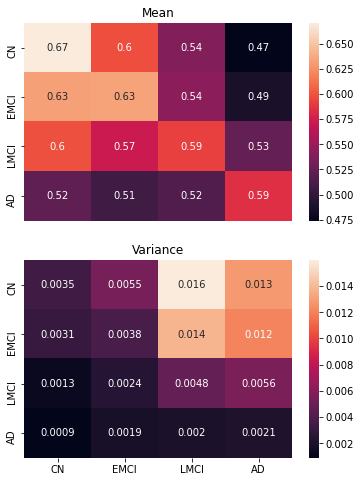

In [51]:
m_mean_sub = np.zeros((len(subjects_groups),len(subjects_groups)))
v_mean_sub = np.zeros((len(subjects_groups),len(subjects_groups)))
for i in range(len(subjects_groups)):
    for j in range(len(subjects_groups)):
        m_mean_sub[i,j]= np.mean(mean_sub[sep[j]:sep[j+1],i])
        v_mean_sub[i,j]= np.var(mean_sub[sep[j]:sep[j+1],i])

plt.figure(figsize=(6,8))

plt.subplot(211)
sns.heatmap(m_mean_sub,yticklabels=subjects_groups,
            annot=True,xticklabels=False)
plt.title('Mean')
plt.subplot(212)

sns.heatmap(v_mean_sub,yticklabels=subjects_groups,
            annot=True,xticklabels=subjects_groups)
plt.title('Variance')
plt.show()

### Standard error and confidence intervals for selected nodes

In [52]:
nodeCR = {}
comb = {}
for sr in str_loc:
    nodeCR[sr] = {}
    comb[sr] ={}
    for i in range(len(sep)-1):
        nodeCR[sr][subjects_groups[i]]=[]
        comb[sr][subjects_groups[i]]=[]
        for nd in snd:
            for s in list(range(sep[i],sep[i+1])):
                comb[sr][subjects_groups[i]].append(str(nd))
                nodeCR[sr][subjects_groups[i]].append(subLRAW[s][nd[0],nd[1]])
    comb[sr][subjects_groups[i]] = np.array(comb[sr][subjects_groups[i]])
    nodeCR[sr][subjects_groups[i]] = np.array(nodeCR[sr][subjects_groups[i]])
    idx = np.where(1 * np.isnan(nodeCR[sr][subjects_groups[i]])==0)[0]
    comb[sr][subjects_groups[i]] = comb[sr][subjects_groups[i]][idx]
    nodeCR[sr][subjects_groups[i]] = nodeCR[sr][subjects_groups[i]][idx]

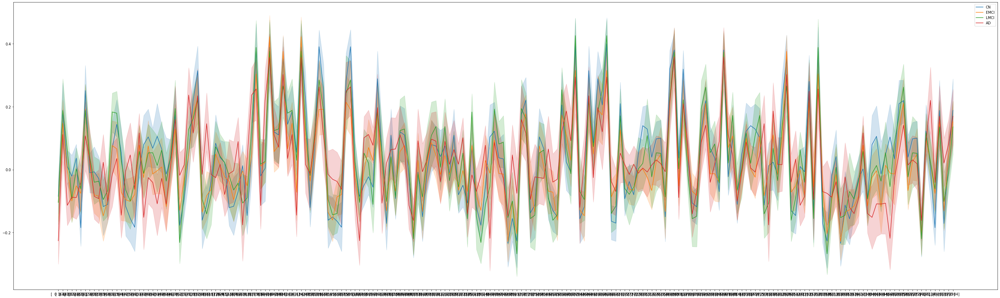

In [53]:
plt.figure(figsize=(50,15))
dr =[]
for g in subjects_groups:
    dr.append(sns.lineplot(x=comb['loc_36p'][g], y=nodeCR['loc_36p'][g]))
plt.legend(subjects_groups)

#### Correlation between the mean networks 

In [54]:
M = 0
for g in subjects_groups:
    try:
        M = np.concatenate((M,meanM[g].reshape((np.shape(subLRAW[3])[0]*np.shape(subLRAW[3])[0],1))), axis=1)
    except ValueError:
        M = meanM[g].reshape((np.shape(subLRAW[3])[0]*np.shape(subLRAW[3])[0],1))
        
mean_corr = np.corrcoef(M.T)

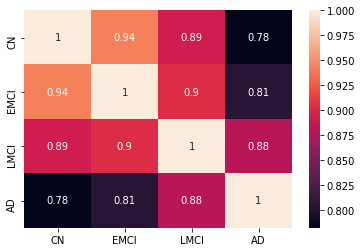

In [55]:
sns.heatmap(mean_corr,
            yticklabels=subjects_groups,
            xticklabels=subjects_groups,
            annot=True)

#### Correlation based on Adjacency matrices

In [56]:
subL_adj = []
subLRAW_adj = []
removed = []
if enodes_name!= 'all':
    removed = [i for i in range(360) if i not in enodes]
for s in cols:
    M = gla.read_adj_M(s,ds,ct,tm,negative=negative_corr)
    for i in removed:
        M[i,:]= np.zeros(np.shape(M)[0])
        M = M.T
        M[i,:]= np.zeros(np.shape(M)[0])
        M = M.T
    subLRAW_adj.append(M - np.mean(M))
    M = M[enodes,:][:,enodes]
    subL_adj.append(M - np.mean(M))

In [57]:
rv_results_adj = ho.RVcoeff(subL_adj)

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


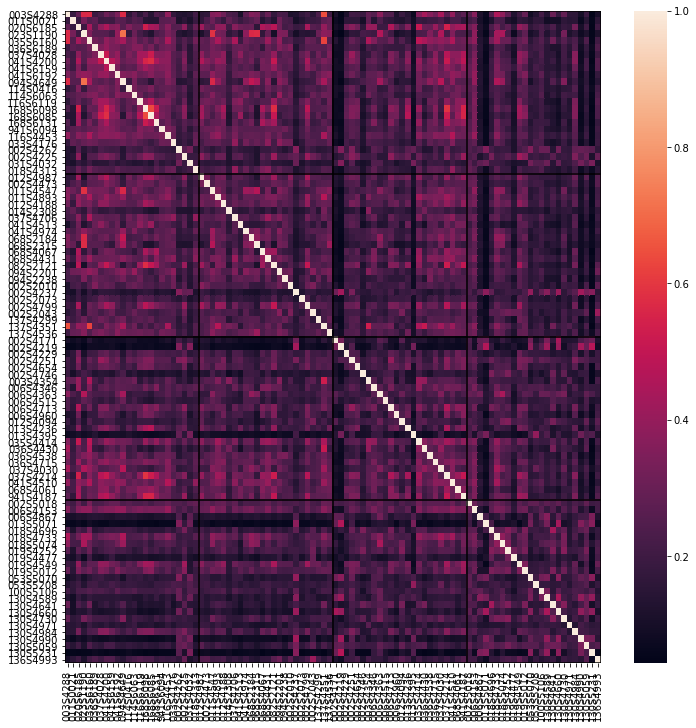

In [58]:
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(rv_results_adj,xticklabels=cols,yticklabels=cols,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

In [59]:
subC_adj = 0
for i in range(sep[-1]):
    try:
        subC_adj = np.concatenate((subC_adj,subL_adj[i].reshape((1,np.shape(subL_adj[3])[0]*np.shape(subL_adj[3])[0]))), axis=0)
    except ValueError:
        subC_adj = subL_adj[i].reshape((1,np.shape(subL_adj[3])[0]*np.shape(subL_adj[3])[0]))

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


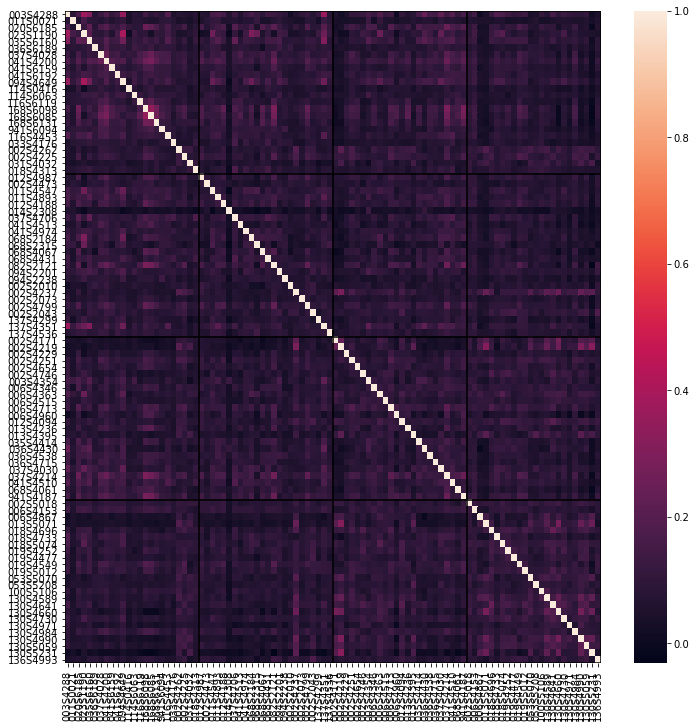

In [60]:
pearsonC = np.corrcoef(subC_adj, y=None, rowvar=True)
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(pearsonC,xticklabels=cols,yticklabels=cols,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

mantelC = np.zeros((sep[-1], sep[-1]), float)
for i in range(sep[-1]):
    for j in range(i+1,sep[-1]):
        a = subL[i]
        b = subL[j]
        np.fill_diagonal(a, 0)
        np.fill_diagonal(b, 0)
        a = np.round(a, 9)
        b = np.round(b, 9)
        mantelC[i,j] = mantel(a,b)[0]

mantelC = np.where(mantelC,mantelC,mantelC.T)

fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
ax = sns.heatmap(mantelC,xticklabels=False,yticklabels=False,ax=ax)
ax.hlines(sep, *ax.get_xlim())
ax.vlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

np.save("%s/data/08_group_level/mantelC"%(rootdir), mantelC)

### Mean Network

#### Construct the mean network of adjacency matrices of all subjects from different groups:

In [61]:
meanM_adj = {}
meanG_adj = {}
for g in range(len(subjects_groups)):
    con  = np.dstack(subLRAW_adj[sep[g]:sep[g+1]])
    meanM_adj[subjects_groups[g]] = np.mean(con, axis=2)
    meanG_adj[subjects_groups[g]] = nx.from_numpy_matrix(meanM_adj[subjects_groups[g]])
    nx.write_gexf(meanG_adj[subjects_groups[g]],"%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s-%s_ds-%s_corr-%s_tm-%s.gexf"
                  %(rootdir,tm,ct,ds,subjects_groups[g],sgn,'adj',ds,ct,tm))                   
    np.save("%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s-%s_ds-%s_corr-%s_tm-%s"
                  %(rootdir,tm,ct,ds,subjects_groups[g],sgn,'adj',ds,ct,tm), meanM_adj[subjects_groups[g]])

con = np.dstack(subLRAW_adj[0:sep[-1]])
meanM_adj['all'] = np.mean(con, axis=2)
meanG_adj['all'] = nx.from_numpy_matrix(meanM_adj['all'])
nx.write_gexf(meanG_adj['all'],"%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s-%s_ds-%s_corr-%s_tm-%s.gexf"
              %(rootdir,tm,ct,ds,'all',sgn,'adj',ds,ct,tm))                    
np.save("%s/data/08_group_level/mean_network/tm-%s/corr-%s/ds-%s/%s_%s-%s_ds-%s_corr-%s_tm-%s"
        %(rootdir,tm,ct,ds,'all',sgn,'adj',ds,ct,tm), meanM_adj['all'])

#### Visualize the mean networks:

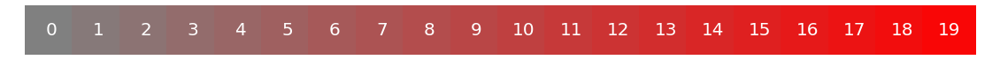

Top 0.5% edges Of Mean Network of adjacency matrices Between CN Subjects


/home/alireza/Thesis/THSenv/lib/python3.6/site-packages/matplotlib/collections.py:886: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


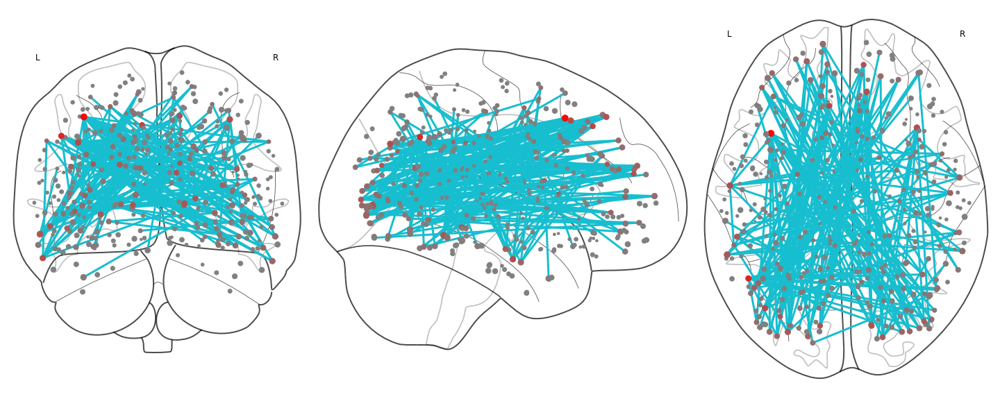

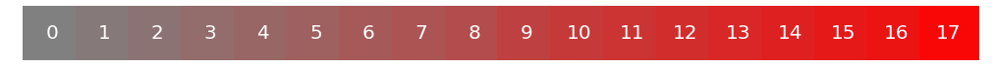

Top 0.5% edges Of Mean Network of adjacency matrices Between EMCI Subjects


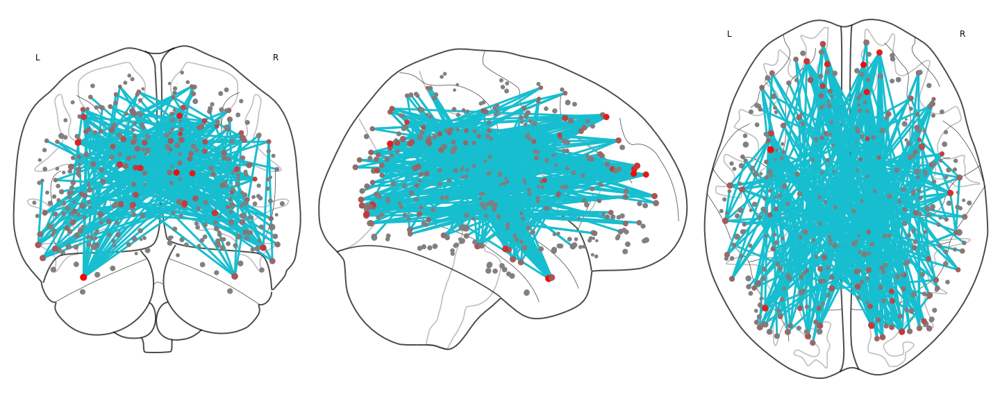

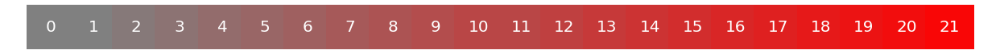

Top 0.5% edges Of Mean Network of adjacency matrices Between LMCI Subjects


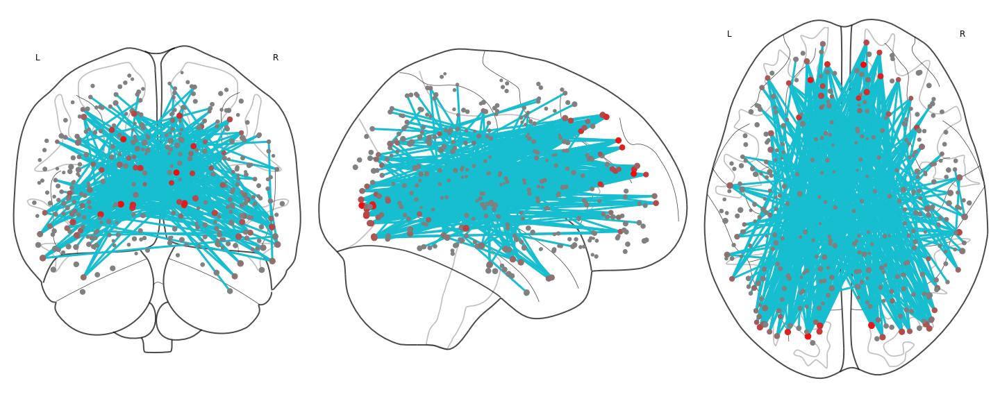

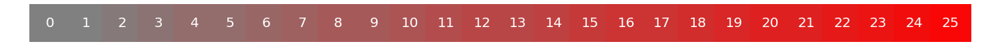

Top 0.5% edges Of Mean Network of adjacency matrices Between AD Subjects


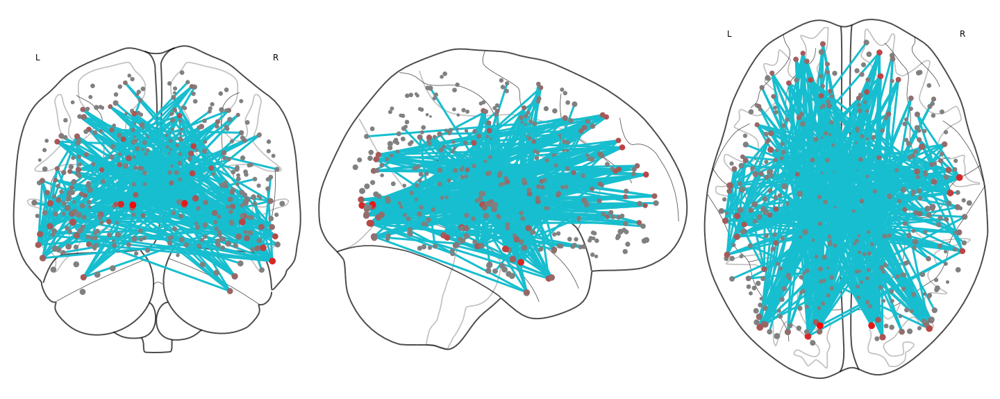

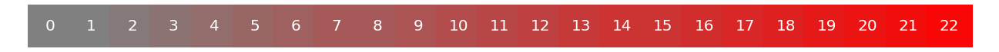

Top 0.5% edges Of Mean Network of adjacency matrices Between all Subjects


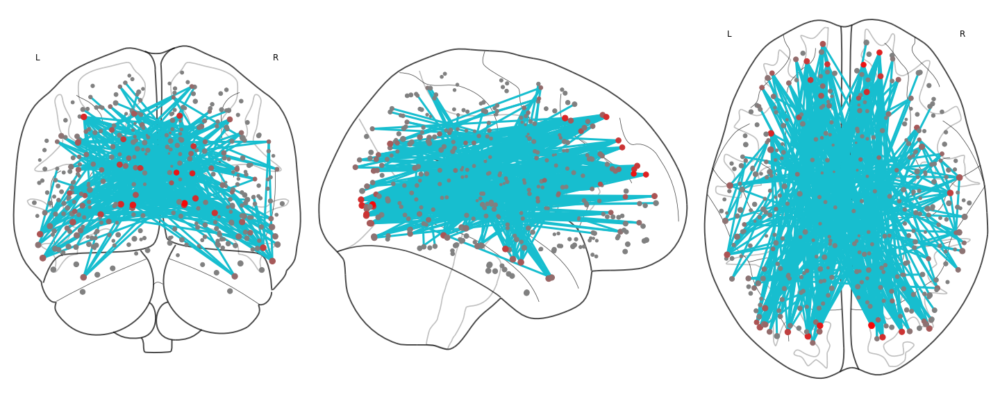

In [62]:
dirc = rootdir + "/figs/mean_network/adj"
for g in sg:
    title = "Top 0.5%% edges Of Mean Network of adjacency matrices Between %s Subjects"%g
    viz.brain_viz_from_path(cm = meanM_adj[g],title=title,density=.005,method='2d')

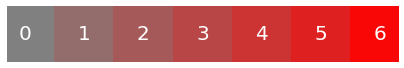

Top 0.5% edges Of Mean Network of adjacency matrices Between CN Subjects


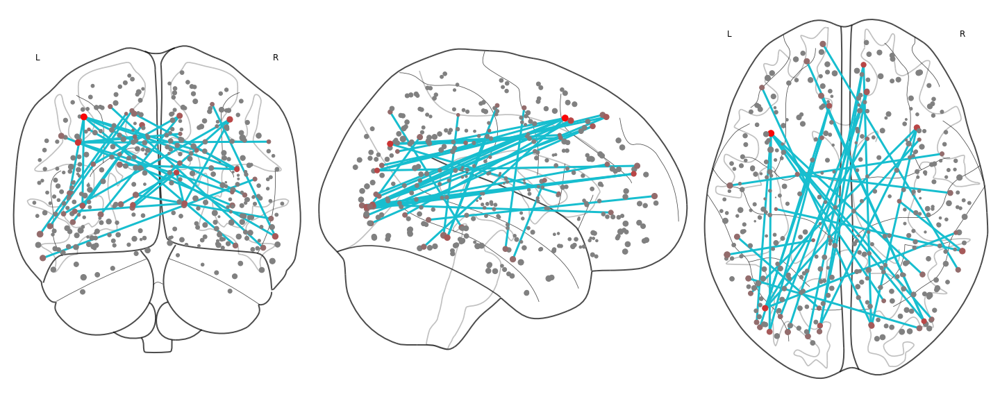

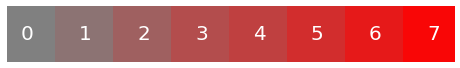

Top 0.5% edges Of Mean Network of adjacency matrices Between EMCI Subjects


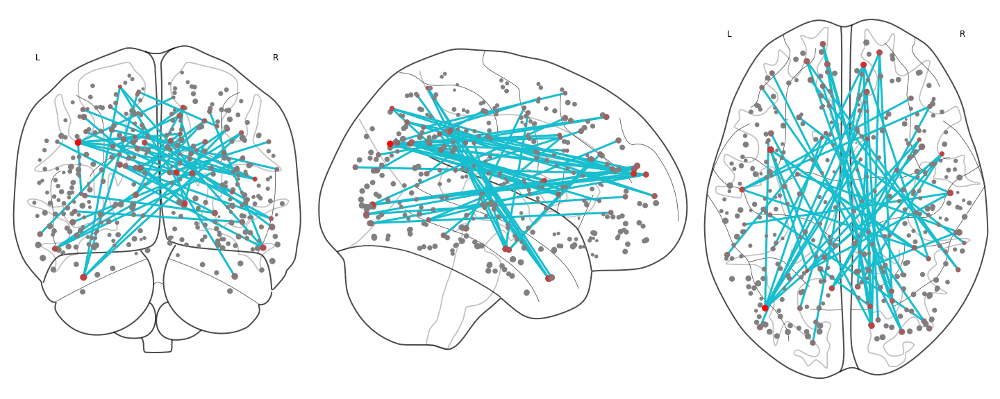

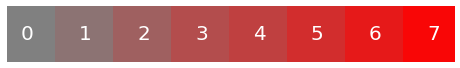

Top 0.5% edges Of Mean Network of adjacency matrices Between LMCI Subjects


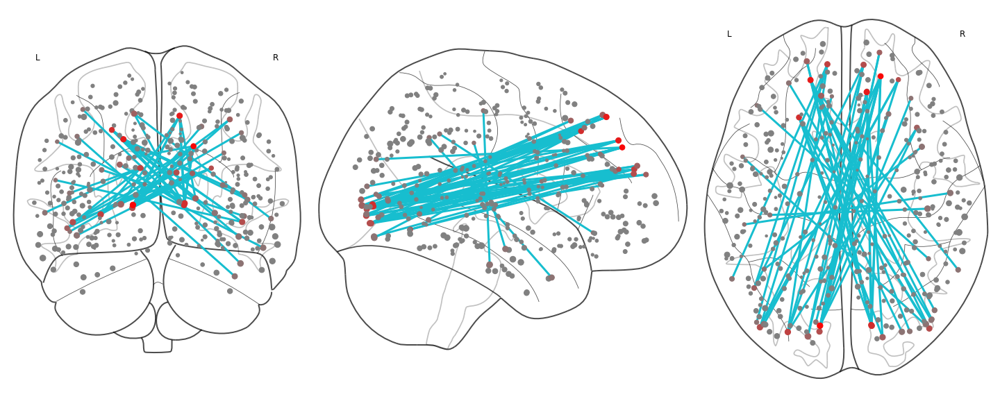

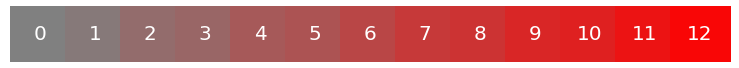

Top 0.5% edges Of Mean Network of adjacency matrices Between AD Subjects


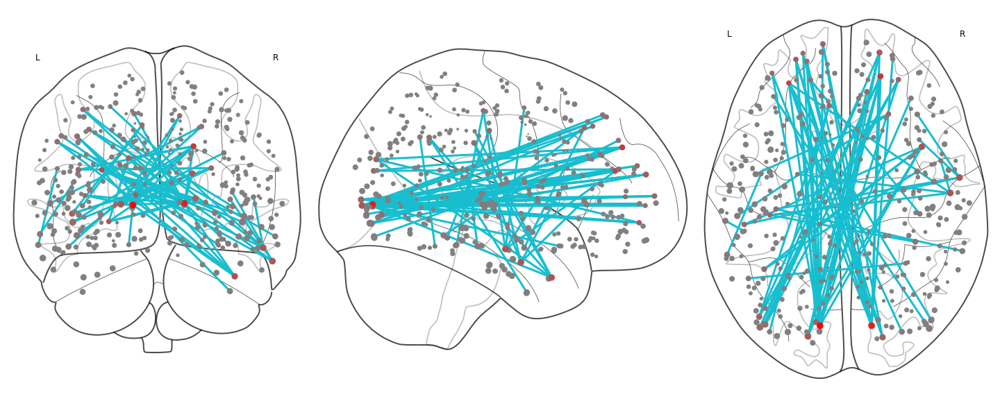

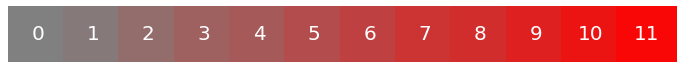

Top 0.5% edges Of Mean Network of adjacency matrices Between all Subjects


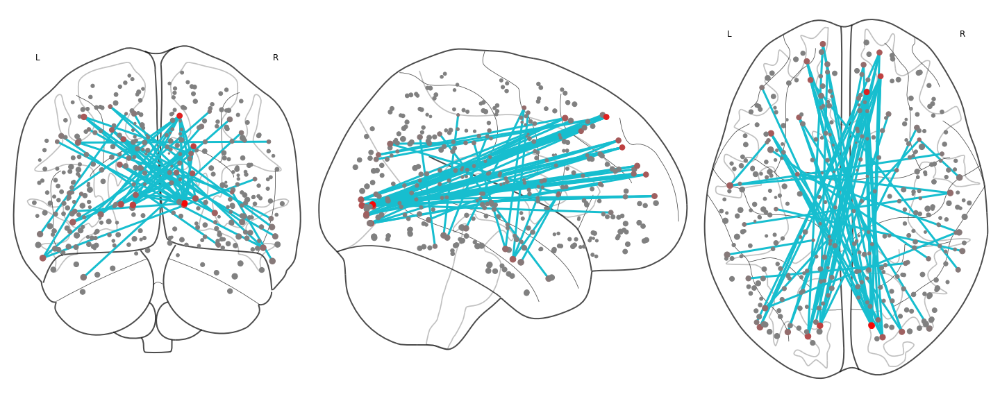

In [63]:
dirc = rootdir + "/figs/mean_network/adj"
for g in sg:
    title = "Top 0.5%% edges Of Mean Network of adjacency matrices Between %s Subjects"%g
    viz.brain_viz_from_path(cm = meanM_adj[g],title=title,density=.001,method='2d')

#### Correlation between the mean networks and the subjects

In [64]:
mean_sub_adj = np.zeros((len(cols),len(subjects_groups)))
for j in range(len(subjects_groups)):
    mv = meanM_adj[subjects_groups[j]].reshape((1,np.shape(subLRAW_adj[3])[0]*np.shape(subLRAW_adj[3])[0]))
    for i in range(len(cols)):
        s = subLRAW_adj[i].reshape((1,np.shape(subLRAW_adj[3])[0]*np.shape(subLRAW_adj[3])[0]))
        mean_sub_adj[i,j] = np.corrcoef(mv,s)[0,1]

sections :  ['CN', 'EMCI', 'LMCI', 'AD']
size     :  [0, 24, 48, 72, 96]


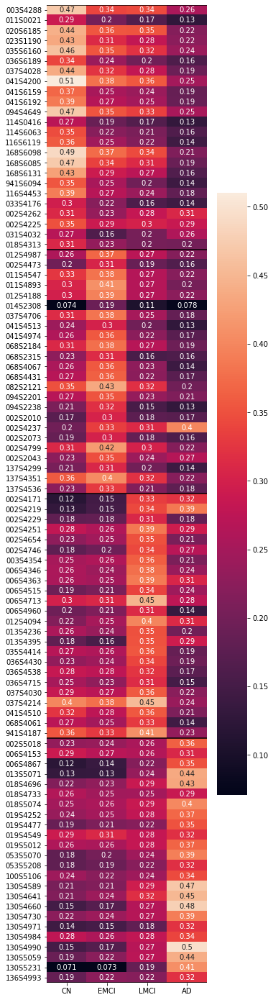

In [65]:
fig, ax = plt.subplots(figsize=(5,25))         # Sample figsize in inches
ax = sns.heatmap(mean_sub_adj,
            xticklabels=subjects_groups,
            yticklabels=cols,
            annot=True, ax = ax)
ax.hlines(sep, *ax.get_xlim())

print('sections : ',subjects_groups)
print('size     : ',sep)

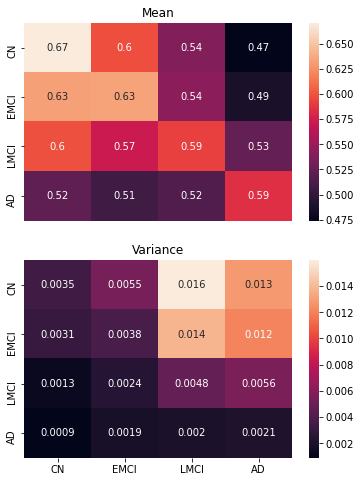

In [66]:
m_mean_sub = np.zeros((len(subjects_groups),len(subjects_groups)))
v_mean_sub = np.zeros((len(subjects_groups),len(subjects_groups)))
for i in range(len(subjects_groups)):
    for j in range(len(subjects_groups)):
        m_mean_sub[i,j]= np.mean(mean_sub[sep[j]:sep[j+1],i])
        v_mean_sub[i,j]= np.var(mean_sub[sep[j]:sep[j+1],i])

plt.figure(figsize=(6,8))

plt.subplot(211)
sns.heatmap(m_mean_sub,yticklabels=subjects_groups,
            annot=True,xticklabels=False)
plt.title('Mean')
plt.subplot(212)

sns.heatmap(v_mean_sub,yticklabels=subjects_groups,
            annot=True,xticklabels=subjects_groups)
plt.title('Variance')
plt.show()

#### Correlation between the mean networks 

In [67]:
M = 0
for g in subjects_groups:
    try:
        M = np.concatenate((M,meanM_adj[g].reshape((np.shape(subLRAW_adj[3])[0]*np.shape(subLRAW_adj[3])[0],1))), axis=1)
    except ValueError:
        M = meanM_adj[g].reshape((np.shape(subLRAW_adj[3])[0]*np.shape(subLRAW_adj[3])[0],1))
        
mean_corr_adj = np.corrcoef(M.T)

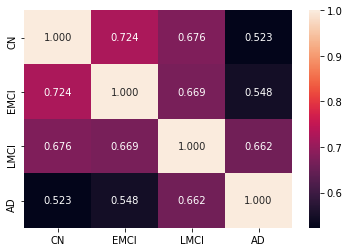

In [68]:
sns.heatmap(mean_corr_adj,
            yticklabels=subjects_groups,
            xticklabels=subjects_groups,
            annot=True, fmt='0.3f')

### Save the notebook